<a href="https://colab.research.google.com/github/Yaroslavwvw/image_processing/blob/main/%D0%9A%D0%BE%D0%BF%D0%B8%D1%8F_%D0%B1%D0%BB%D0%BE%D0%BA%D0%BD%D0%BE%D1%82%D0%B0_%22%D0%9F%D1%80%D0%BE%D0%B5%D0%BA%D1%82%D0%BD%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_%E2%84%965_%D0%90%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7_%D0%B8_%D1%81%D1%80%D0%B0%D0%B2%D0%BD%D0%B5%D0%BD%D0%B8%D0%B5_%D0%B4%D0%B5%D1%82%D0%B5%D0%BA%D1%82%D0%BE%D1%80%D0%BE%D0%B2_%D0%BA%D0%BB%D1%8E%D1%87%D0%B5%D0%B2%D1%8B%D1%85_%D1%82%D0%BE%D1%87%D0%B5%D0%BA_%D0%B8_%D0%B4%D0%B5%D1%81%D0%BA%D1%80%D0%B8%D0%BF%D1%82%D0%BE%D1%80%D0%BE%D0%B2_%D0%B2_OpenCV_ipynb%22.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Проектная работа №5. Анализ и сравнение детекторов ключевых точек и дескрипторов в OpenCV**


## **1. Цель работы**



Выполнить экспериментальное исследование детекторов и дескрипторов ключевых точек (Harris, FAST, ORB, SIFT, AKAZE, BRISK и др.) в различных условиях и для разных типов изображений, оценить их качество и производительность по заданным метрикам и сформулировать рекомендации по выбору оптимальных комбинаций «детектор + дескриптор» для конкретных задач.

## **2. Задачи работы**




1. **Сравнить** работу детекторов и дескрипторов в экстремальных условиях (размытие, шум, сжатие и др.) и оценить их устойчивость, точность локализации и скорость (Задание 1).
2. **Исследовать** мультимодальное сопоставление изображений (RGB/IR, день/ночь, спутник/карта и др.) и оценить качество сопоставлений по метрикам Precision/Recall, F1, ROC-AUC (Задание 2).
3. **Оценить** поведение детекторов/дескрипторов в специфических доменах (медицина, текстуры, документы) по профильным метрикам (регистрация, различимость текстур, качество OCR) (Задание 3).
5. **Собрать и проанализировать** результаты в виде таблиц, графиков и визуализаций, **сделать выводы** и **дать рекомендации** по выбору методов.

---






## **3. Подготовка рабочей среды и данных**



### **3.1. Настройка окружения**

**Что нужно сделать:**

- Установить/проверить наличие библиотек:
  - `opencv-python` (cv2)
  - `numpy`
  - `matplotlib`
  - при необходимости для метрик классификации — `scikit-learn` (можно обойтись и без него, но он упрощает построение PR/ROC).
- Настроить рабочую среду (Jupyter Notebook / Google Colab / локальный Python-скрипт).
- Собрать набор тестовых изображений (из интернета):
  - натурные сцены с текстурами (здания, природные объекты, городские сцены),
  - сцены с текстом (документы, вывески),
  - текстурные поверхности (ткани, дерево, бетон),
  - пары для мультимодальных задач (день/ночь, спутник/карта, RGB/IR — при наличии),
  - при желании — медицинские изображения (рентген, МРТ и т.п.).




In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, roc_curve

print("Libraries imported successfully.")

Libraries imported successfully.


---




### **3.2. Базовые функции для работы с изображениями**

**Что нужно реализовать:**

1. **Функции загрузки** изображений с диска по пути (с возможным приведением к одному размеру при необходимости).
2. **Функцию визуализации** одного или нескольких изображений в виде сетки (matplotlib).
3. (Опционально) Функцию перевода в оттенки серого и нормализации.


load_image and show_images functions defined.
urban_scene already exists at ./urban_scene.jpg
Downloaded textured_surface to ./textured_surface.jpg
Downloaded document to ./document.jpg
Image paths prepared: {'urban_scene': './urban_scene.jpg', 'textured_surface': './textured_surface.jpg', 'document': './document.jpg'}

Loading and displaying images...


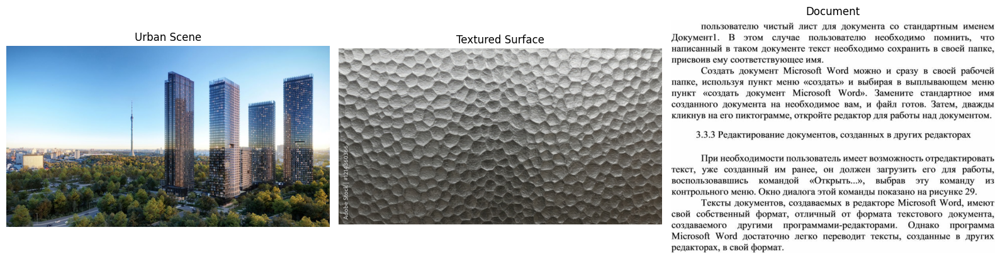

Images loaded and displayed successfully.


In [7]:
import os
import requests
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_image(path):
    """
    Loads an image from the specified path using OpenCV.
    Returns the image (numpy array) if successful, None otherwise.
    """
    img = cv2.imread(path)
    if img is None:
        print(f"Warning: Could not load image from {path}")
    return img


def show_images(images, titles=None, cols=3, fig_size=(15, 5)):
    """
    Displays a list of images in a grid using matplotlib.
    Converts images from BGR (OpenCV default) to RGB.
    """
    if not isinstance(images, list):
        images = [images]
    if titles is not None and not isinstance(titles, list):
        titles = [titles]

    rows = int(np.ceil(len(images) / cols))
    plt.figure(figsize=fig_size)
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        if img is not None:
            # Convert BGR to RGB for matplotlib display
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(titles[i] if titles and len(titles) > i else f"Image {i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()


print("load_image and show_images functions defined.")

image_urls = {
    "urban_scene": "https://www.domex.ru/upload/iblock/7b6/aq943hktmacdgf7nn3gxy5wtf4gurti6.jpg",
    "textured_surface": "https://as2.ftcdn.net/jpg/12/14/36/03/1000_F_1214360366_IgJN5Za8JmQjS7BTmNBppHPQvhZm2MBV.jpg",
    "document": "https://fs.znanio.ru/d5af0e/8a/72/857c80d38bcf039df6a2fb79224ad7ea00.jpg"
}


image_paths = {}
for name, url in image_urls.items():
    filename = f"./{name}.jpg"
    image_paths[name] = filename
    if not os.path.exists(filename):
        print(f"Downloading {name}...")
        try:
            response = requests.get(url, stream=True)
            response.raise_for_status() # Raise an exception for HTTP errors
            with open(filename, 'wb') as f:
                for chunk in response.iter_content(chunk_size=8192):
                    f.write(chunk)
            print(f"Downloaded {name} to {filename}")
        except requests.exceptions.RequestException as e:
            print(f"Error downloading {name}: {e}")
            image_paths[name] = None # Mark as failed
    else:
        print(f"{name} already exists at {filename}")

# Filter out any failed downloads
image_paths = {k: v for k, v in image_paths.items() if v is not None}

print("Image paths prepared:", image_paths)

# Load and display images
loaded_images = []
image_titles = []

print("\nLoading and displaying images...")
for name, path in image_paths.items():
    img = load_image(path)
    if img is not None:
        loaded_images.append(img)
        image_titles.append(name.replace('_', ' ').title())

if loaded_images:
    show_images(loaded_images, titles=image_titles, cols=len(loaded_images), fig_size=(16, 4))
    print("Images loaded and displayed successfully.")
else:
    print("No images were loaded to display.")

---

### **3.3. Базовые функции измерения времени**

**Что нужно реализовать:**

- Простую функцию-обёртку для замера времени выполнения произвольной операции (например, детекция и описание ключевых точек).

**Пояснение:**  
Эта функция будет использоваться в Задании 1 для измерения производительности (время на одно изображение и FPS).



In [8]:
import time
import numpy as np # numpy is already imported in the notebook, but including for clarity if this cell runs independently

def measure_time(func, *args, **kwargs):
    start_time = time.time()
    result = func(*args, **kwargs)
    end_time = time.time()
    elapsed_time = end_time - start_time
    return result, elapsed_time


## **4. Задание 1. Сравнительный анализ детекторов в экстремальных условиях**



### **4.1. Формирование датасета с искажениями**





**Цель:**  
Проверить устойчивость детекторов/дескрипторов к различным искажениям изображения.

**Что нужно сделать:**

1. Выбрать **несколько базовых изображений** (3–5 штук) с богатыми текстурами и структурой:
   - городские сцены (здания),
   - природные сцены (лес, горы),
   - технические объекты (машины, здания с повторяющимися элементами).

2. Для каждого базового изображения сгенерировать **варианты с искажениями**:
   - **Размытие движения (motion blur)** — свёртка с линейным фильтром.
   - **Изменение освещения**:
     - затемнение / осветление (умножение на коэффициент, добавление смещения),
     - имитация «день/ночь» (снижение яркости, усиление контраста).
   - **Поворот и масштабирование** (cv2.warpAffine / cv2.resize).
   - **Шум**:
     - гауссовский (добавление случайной компоненты),
     - импульсный («соль и перец»).
   - **Сжатие JPEG** с разным качеством (cv2.imwrite с параметром `cv2.IMWRITE_JPEG_QUALITY`).

3. Для части искажений, где это возможно (поворот, масштаб, аффинное/проективное преобразование), **сохранять или вычислять известное преобразование** (матрицу аффинного преобразования или гомографии), чтобы использовать её для расчёта метрик (повторяемость, точность локализации).

In [9]:
import cv2
import numpy as np

def apply_motion_blur(image, kernel_size, angle):
    kernel = np.zeros((kernel_size, kernel_size), dtype=np.float32)
    center = kernel_size // 2

    if angle == 0: # Horizontal blur
        kernel[center, :] = 1.0
    elif angle == 90: # Vertical blur
        kernel[:, center] = 1.0
    else: # General angle, rotating a horizontal line kernel
        # Create a horizontal line kernel
        h_kernel = np.zeros((1, kernel_size), dtype=np.float32)
        h_kernel[0, :] = 1.0

        # Convert angle to radians for rotation
        rad = np.deg2rad(angle)

        # Create a rotation matrix
        M = cv2.getRotationMatrix2D((kernel_size / 2, kernel_size / 2), angle, 1)
        if kernel_size > 1:
            for i in range(kernel_size):
                # Approximately draw a line
                x = int(round(center + i * np.cos(rad - np.pi/2)))
                y = int(round(center + i * np.sin(rad - np.pi/2)))
                if 0 <= x < kernel_size and 0 <= y < kernel_size:
                     kernel[y,x] = 1.0
        else: # kernel_size 1 means no blur
            return image

    kernel = kernel / np.sum(kernel)
    blurred_image = cv2.filter2D(image, -1, kernel)
    return blurred_image

def change_brightness_contrast(image, alpha, beta):
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

def add_gaussian_noise(image, mean=0, sigma=25):
    if image.dtype != np.float32:
        float_image = image.astype(np.float32) / 255.0 # Normalize to [0,1] for noise addition
    else:
        float_image = image.copy() # Assume already normalized if float32

    row, col, ch = float_image.shape
    gauss = np.random.normal(mean, sigma/255.0, (row, col, ch)) # Sigma relative to [0,1]
    gauss = gauss.reshape(row, col, ch)
    noisy_image = float_image + gauss

    noisy_image = np.clip(noisy_image * 255.0, 0, 255).astype(np.uint8)
    return noisy_image

def add_salt_pepper_noise(image, amount=0.04):
    noisy_image = image.copy()
    row, col, ch = image.shape

    num_salt = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[coords[0], coords[1], :] = 255

    num_pepper = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[coords[0], coords[1], :] = 0
    return noisy_image

def jpeg_compress_decompress(image, quality=50):
    """
    Compresses and decompresses an image using JPEG with a specified quality.
    quality: JPEG compression quality (0-100).
    """
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
    _, encimg = cv2.imencode('.jpg', image, encode_param)
    decimg = cv2.imdecode(encimg, 1)
    return decimg


---



### **4.2. Реализация пайплайна «детектор + дескриптор + сопоставление»**



**Что нужно сделать:**

1. Выбрать набор комбинаций:
   - SIFT (детектор+дескриптор),
   - ORB (детектор+дескриптор),
   - AKAZE (детектор+дескриптор),
   - FAST + SIFT (быстрый детектор, «тяжёлый» дескриптор),
   - BRISK (детектор+дескриптор) — при желании.

2. Для каждой комбинации реализовать:
   - детекцию ключевых точек на **оригинальном** и **искажённом** изображениях;
   - вычисление дескрипторов;
   - сопоставление (например, BFMatcher c расстоянием Хэмминга для бинарных дескрипторов и L2 для вещественных).



In [10]:
import cv2
import numpy as np

def detect_and_describe(image, method="SIFT"):
    """
    Detects keypoints and computes descriptors for a given image using specified method.

    Args:
        image (np.array): Input image (BGR format).
        method (str): Feature detection and description method (e.g., 'SIFT', 'ORB', 'AKAZE', 'FAST+SIFT').

    Returns:
        tuple: (keypoints, descriptors)
    """
    if image is None:
        return [], None

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    if method == "SIFT":
        detector = cv2.SIFT_create()
    elif method == "ORB":
        detector = cv2.ORB_create()
    elif method == "AKAZE":
        detector = cv2.AKAZE_create()
    elif method == "FAST+SIFT":
        # FAST for detection
        fast = cv2.FastFeatureDetector_create()
        kp = fast.detect(gray_image, None)
        # SIFT for description
        detector = cv2.SIFT_create()
        kp, des = detector.compute(gray_image, kp)
        return kp, des
    elif method == "BRISK": # Optional, as mentioned in notebook but not explicit in subtask
        detector = cv2.BRISK_create()
    else:
        raise ValueError(f"Unknown method: {method}")

    kp, des = detector.detectAndCompute(gray_image, None)
    return kp, des

def match_descriptors(desc1, desc2, method="BF"):
    """
    Matches descriptors between two sets using specified method.

    Args:
        desc1 (np.array): Descriptors from the first image.
        desc2 (np.array): Descriptors from the second image.
        method (str): Matching method ('BF' for Brute-Force, 'FLANN' for FLANN-based).

    Returns:
        list: List of raw matches.
    """
    if desc1 is None or desc2 is None:
        return []
    if len(desc1) == 0 or len(desc2) == 0:
        return []

    if method == "BF":
        # Determine distance metric based on descriptor type
        # SIFT descriptors are typically float32 (L2 distance)
        # ORB/AKAZE/BRISK are binary (HAMMING distance)
        if desc1.dtype == np.uint8:
            norm_type = cv2.NORM_HAMMING
        else:
            norm_type = cv2.NORM_L2

        matcher = cv2.BFMatcher(norm_type, crossCheck=False) # CrossCheck=True could be used for initial filtering
    elif method == "FLANN":
        # FLANN parameters
        # For SIFT, SURF (floating-point descriptors)
        if desc1.dtype == np.float32:
            FLANN_INDEX_KDTREE = 1
            index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        # For ORB, AKAZE, BRISK (binary descriptors)
        elif desc1.dtype == np.uint8:
            FLANN_INDEX_LSH = 6
            index_params = dict(algorithm = FLANN_INDEX_LSH,
                                table_number = 6, # 12
                                key_size = 12,     # 20
                                multi_probe_level = 1) # 2
        else:
            raise ValueError("Unsupported descriptor type for FLANN matching.")

        search_params = dict(checks = 50)
        matcher = cv2.FlannBasedMatcher(index_params, search_params)
    else:
        raise ValueError(f"Unknown matching method: {method}")

    matches = matcher.knnMatch(desc1, desc2, k=2)
    return matches

print("detect_and_describe and match_descriptors functions defined.")

detect_and_describe and match_descriptors functions defined.


---




### **4.3. Метрики для оценки**

#### **4.3.1. Повторяемость (repeatability)**

**Смысл метрики:**  
Показывает, какой процент ключевых точек, найденных на одном изображении, можно «узнать» на другом при известном геометрическом преобразовании (аффинном или гомографии).

**Идея:**

1. Имеем:
   - набор ключевых точек `kp1` на изображении 1,
   - набор ключевых точек `kp2` на изображении 2,
   - известную матрицу преобразования `H` (гомография или аффинное преобразование).
2. Преобразуем координаты `kp1` в систему координат второго изображения.
3. Считаем, что точка повторилась, если в окрестности радиуса `r` от преобразованной точки есть ключевая точка из `kp2`.
4. Повторяемость =  
   $
   \text{repeatability} = \frac{N_{\text{совпавших}}}{\min(N_1, N_2)}
   \times 100\%
   $

```python
import numpy as np
import cv2

def keypoints_to_array(keypoints):
    """
    Преобразует список cv2.KeyPoint в массив координат shape (N, 2).
    """
    return np.array([kp.pt for kp in keypoints], dtype=np.float32)

def transform_points(points, H):
    """
    Преобразует точки (x, y) матрицей гомографии H.
    
    points: np.array shape (N, 2)
    H: np.array shape (3, 3)
    """
    num = points.shape[0]
    # Добавляем однородную координату
    pts_h = np.hstack([points, np.ones((num, 1), dtype=np.float32)])
    pts_t = (H @ pts_h.T).T   # shape (N, 3)
    # Переход обратно к декартовым координатам
    pts_t = pts_t[:, :2] / pts_t[:, 2:3]
    return pts_t

def compute_repeatability(kp1, kp2, H_1_to_2, radius=3.0, image_shape_2=None):
    """
    Вычисляет повторяемость ключевых точек.
    
    kp1, kp2: списки cv2.KeyPoint для изображений 1 и 2.
    H_1_to_2: матрица гомографии (из 1 в 2).
    radius: допустимое отклонение (в пикселях) для совпадения точки.
    image_shape_2: (h, w) изображения 2 для ограничения области (опционально).
    """
    if len(kp1) == 0 or len(kp2) == 0:
        return 0.0, 0
    
    pts1 = keypoints_to_array(kp1)  # (N1, 2)
    pts2 = keypoints_to_array(kp2)  # (N2, 2)
    
    # Преобразуем точки из изображения 1 в систему координат 2-го
    pts1_t = transform_points(pts1, H_1_to_2)  # (N1, 2)
    
    # Опционально отбрасываем точки, которые вышли за границы 2-го изображения
    if image_shape_2 is not None:
        h2, w2 = image_shape_2[:2]
        mask_inside = (
            (pts1_t[:, 0] >= 0) & (pts1_t[:, 0] < w2) &
            (pts1_t[:, 1] >= 0) & (pts1_t[:, 1] < h2)
        )
        pts1_t = pts1_t[mask_inside]
    
    if pts1_t.shape[0] == 0:
        return 0.0, 0
    
    # Для поиска ближайших точек можно использовать простой перебор
    # (для учебных размеров этого достаточно).
    matched = 0
    for p in pts1_t:
        dists = np.linalg.norm(pts2 - p[None, :], axis=1)
        if np.min(dists) <= radius:
            matched += 1
    
    N1 = pts1_t.shape[0]
    N2 = pts2.shape[0]
    denominator = max(1, min(N1, N2))
    
    repeatability = matched / denominator * 100.0
    return repeatability, matched
```


---

#### **4.3.2. Точность локализации (mean localization error)**



**Смысл метрики:**  
Если у нас есть пары «соответствующих» точек, можно измерить среднее расстояние между реальным положением точки и предсказанным (по гомографии). Чем меньше ошибка, тем лучше локализация.

**Идея (упрощённо):**

- Для каждой пары соответствий `(p1, p2)`:
  - преобразуем `p1` матрицей `H` → `p1’`,
  - считаем расстояние `d = ||p1’ − p2||`,
- Средняя ошибка — среднее значение `d` по всем «хорошим» соответствиям (например, инлайерам RANSAC).




```python
def compute_localization_error(matches, kp1, kp2, H_1_to_2, inlier_mask=None):
    """
    Вычисляет среднюю ошибку локализации по сопоставлениям.
    
    matches: список cv2.DMatch (обычно после фильтрации и RANSAC).
    kp1, kp2: списки cv2.KeyPoint для изображений 1 и 2.
    H_1_to_2: матрица гомографии.
    inlier_mask: опциональная маска инлайеров (список или np.array из 0/1).
    """
    if len(matches) == 0:
        return None
    
    pts1 = []
    pts2 = []
    for i, m in enumerate(matches):
        if (inlier_mask is not None) and (not inlier_mask[i]):
            continue
        pts1.append(kp1[m.queryIdx].pt)
        pts2.append(kp2[m.trainIdx].pt)
    
    if len(pts1) == 0:
        return None
    
    pts1 = np.array(pts1, dtype=np.float32)
    pts2 = np.array(pts2, dtype=np.float32)
    
    pts1_t = transform_points(pts1, H_1_to_2)
    errors = np.linalg.norm(pts1_t - pts2, axis=1)
    return float(np.mean(errors)), errors
```

---



In [12]:
import numpy as np
import cv2

def keypoints_to_array(keypoints):
    """
    Преобразует список cv2.KeyPoint в массив координат shape (N, 2).
    """
    return np.array([kp.pt for kp in keypoints], dtype=np.float32)

def transform_points(points, H):
    """
    Преобразует точки (x, y) матрицей гомографии H.

    points: np.array shape (N, 2)
    H: np.array shape (3, 3)
    """
    num = points.shape[0]
    # Добавляем однородную координату
    pts_h = np.hstack([points, np.ones((num, 1), dtype=np.float32)])
    pts_t = (H @ pts_h.T).T   # shape (N, 3)
    # Переход обратно к декартовым координатам
    pts_t = pts_t[:, :2] / pts_t[:, 2:3]
    return pts_t

def compute_repeatability(kp1, kp2, H_1_to_2, radius=3.0, image_shape_2=None):
    """
    Вычисляет повторяемость ключевых точек.

    kp1, kp2: списки cv2.KeyPoint для изображений 1 и 2.
    H_1_to_2: матрица гомографии (из 1 в 2).
    radius: допустимое отклонение (в пикселях) для совпадения точки.
    image_shape_2: (h, w) изображения 2 для ограничения области (опционально).
    """
    if len(kp1) == 0 or len(kp2) == 0:
        return 0.0, 0

    pts1 = keypoints_to_array(kp1)  # (N1, 2)
    pts2 = keypoints_to_array(kp2)  # (N2, 2)

    # Преобразуем точки из изображения 1 в систему координат 2-го
    pts1_t = transform_points(pts1, H_1_to_2)  # (N1, 2)

    # Опционально отбрасываем точки, которые вышли за границы 2-го изображения
    if image_shape_2 is not None:
        h2, w2 = image_shape_2[:2]
        mask_inside = (
            (pts1_t[:, 0] >= 0) & (pts1_t[:, 0] < w2) &
            (pts1_t[:, 1] >= 0) & (pts1_t[:, 1] < h2)
        )
        pts1_t = pts1_t[mask_inside]

    if pts1_t.shape[0] == 0:
        return 0.0, 0

    # Для поиска ближайших точек можно использовать простой перебор
    # (для учебных размеров этого достаточно).
    matched = 0
    for p in pts1_t:
        dists = np.linalg.norm(pts2 - p[None, :], axis=1)
        if np.min(dists) <= radius:
            matched += 1

    N1 = pts1_t.shape[0]
    N2 = pts2.shape[0]
    denominator = max(1, min(N1, N2)) # Avoid division by zero

    repeatability = matched / denominator * 100.0
    return repeatability, matched

def compute_localization_error(matches, kp1, kp2, H_1_to_2, inlier_mask=None):
    """
    Вычисляет среднюю ошибку локализации по сопоставлениям.

    matches: список cv2.DMatch (обычно после фильтрации и RANSAC).
    kp1, kp2: списки cv2.KeyPoint для изображений 1 и 2.
    H_1_to_2: матрица гомографии.
    inlier_mask: опциональная маска инлайеров (список или np.array из 0/1).
    """
    if len(matches) == 0:
        return None, None # Return None for both error and errors array

    pts1 = []
    pts2 = []
    for i, m in enumerate(matches):
        if (inlier_mask is not None) and (not inlier_mask[i]):
            continue
        pts1.append(kp1[m.queryIdx].pt)
        pts2.append(kp2[m.trainIdx].pt)

    if len(pts1) == 0:
        return None, None

    pts1 = np.array(pts1, dtype=np.float32)
    pts2 = np.array(pts2, dtype=np.float32)

    pts1_t = transform_points(pts1, H_1_to_2)
    errors = np.linalg.norm(pts1_t - pts2, axis=1)
    return float(np.mean(errors)), errors

def compute_inlier_ratio(matches_mask):
    """
    Вычисляет долю инлайеров по маске, возвращаемой cv2.findHomography.

    matches_mask: np.array или список 0/1 (или True/False),
                  длина равна числу сопоставлений, поданных в findHomography.
    """
    if matches_mask is None:
        return 0.0, 0
    mask = np.array(matches_mask).astype(bool)
    total = len(mask)
    if total == 0:
        return 0.0, 0
    inliers = np.sum(mask)
    ratio = inliers / total * 100.0
    return ratio, inliers

def apply_geometric_transform(image, angle, scale):
    h, w = image.shape[:2]

    M = cv2.getRotationMatrix2D((w / 2, h / 2), angle, scale)


    H_matrix = np.vstack([M, [0, 0, 1]]).astype(np.float32)


    transformed_image = cv2.warpAffine(image, M, (w, h))

    return transformed_image, H_matrix


#### **4.3.3. Время выполнения и FPS**

**Смысл:**  
Оценить, сколько времени занимает полный пайплайн (детекция + дескрипторы + сопоставление) на одном изображении и как это зависит от разрешения.

**Идея:**

- Для каждой комбинации (метод, разрешение) измеряем среднее время по нескольким запускам.
- FPS ≈ 1 / (среднее время кадра).

```python
import time

def measure_pipeline_time(pipeline_func, image1, image2, runs=5):
    """
    Измеряет среднее время выполнения пользовательского пайплайна.
    
    pipeline_func: функция, внутри которой выполняются
                   детекция, вычисление дескрипторов и сопоставление.
    image1, image2: пара изображений.
    """
    times = []
    for _ in range(runs):
        start = time.time()
        _ = pipeline_func(image1, image2)
        times.append(time.time() - start)
    mean_time = np.mean(times)
    fps = 1.0 / mean_time if mean_time > 0 else None
    return mean_time, fps, times
```


---

#### **4.3.4. Процент правильных сопоставлений и устойчивость к выбросам (RANSAC inliers)**





**Смысл:**

- **Процент правильных сопоставлений** — доля инлайеров (правильных соответствий) среди всех найденных сопоставлений.
- **Устойчивость к выбросам** — насколько хорошо метод справляется с ложными сопоставлениями (высокий процент инлайеров = хорошая устойчивость).

**Типичный сценарий:**

1. Получили список сопоставлений `matches`.
2. Построили гомографию через `cv2.findHomography(..., method=cv2.RANSAC, ...)`, получили маску инлайеров `mask`.
3. Считаем процент инлайеров.

```python
def compute_inlier_ratio(matches_mask):
    """
    Вычисляет долю инлайеров по маске, возвращаемой cv2.findHomography.
    
    matches_mask: np.array или список 0/1 (или True/False),
                  длина равна числу сопоставлений, поданных в findHomography.
    """
    mask = np.array(matches_mask).astype(bool)
    total = len(mask)
    if total == 0:
        return 0.0, 0
    inliers = np.sum(mask)
    ratio = inliers / total * 100.0
    return ratio, inliers
```

---

### **4.4. Проведение экспериментов и сбор результатов**





**Что нужно сделать:**

1. Для каждой комбинации детектор+дескриптор (SIFT, ORB, AKAZE, FAST+SIFT, BRISK и т.п.) и каждого типа искажения:
   - измерить **повторяемость**;
   - измерить **точность локализации** (при наличии гомографии);
   - измерить **время выполнения** и **FPS**;
   - вычислить **процент инлайеров (inlier ratio)** после RANSAC.

2. Свести результаты в таблицы, например:

| Метод | Искажение | Repeatability (%) | Loc. error (px) | Inliers (%) | Time (s) | FPS |
|-------|-----------|-------------------|------------------|-------------|----------|-----|

3. Построить графики:
   - зависимость времени/кол-ва ключевых точек от разрешения;
   - зависимость метрик от силы искажения (например, длина размытия, уровень шума, степень сжатия).

Starting experiments...

Processing base image: Urban Scene
  Applying augmentation: Motion Blur (k=15, a=0)
    Method: SIFT
    Method: ORB
    Method: AKAZE
    Method: FAST+SIFT
  Applying augmentation: Motion Blur (k=25, a=45)
    Method: SIFT
    Method: ORB
    Method: AKAZE
    Method: FAST+SIFT
  Applying augmentation: Brightness/Contrast (a=0.6, b=0)
    Method: SIFT
    Method: ORB
    Method: AKAZE
    Method: FAST+SIFT
  Applying augmentation: Brightness/Contrast (a=1.4, b=30)
    Method: SIFT
    Method: ORB
    Method: AKAZE
    Method: FAST+SIFT
  Applying augmentation: Gaussian Noise (s=15)
    Method: SIFT
    Method: ORB
    Method: AKAZE
    Method: FAST+SIFT
  Applying augmentation: Gaussian Noise (s=40)
    Method: SIFT
    Method: ORB
    Method: AKAZE
    Method: FAST+SIFT
  Applying augmentation: Salt & Pepper (amt=0.01)
    Method: SIFT
    Method: ORB
    Method: AKAZE
    Method: FAST+SIFT
  Applying augmentation: Salt & Pepper (amt=0.05)
    Method: SIFT
  

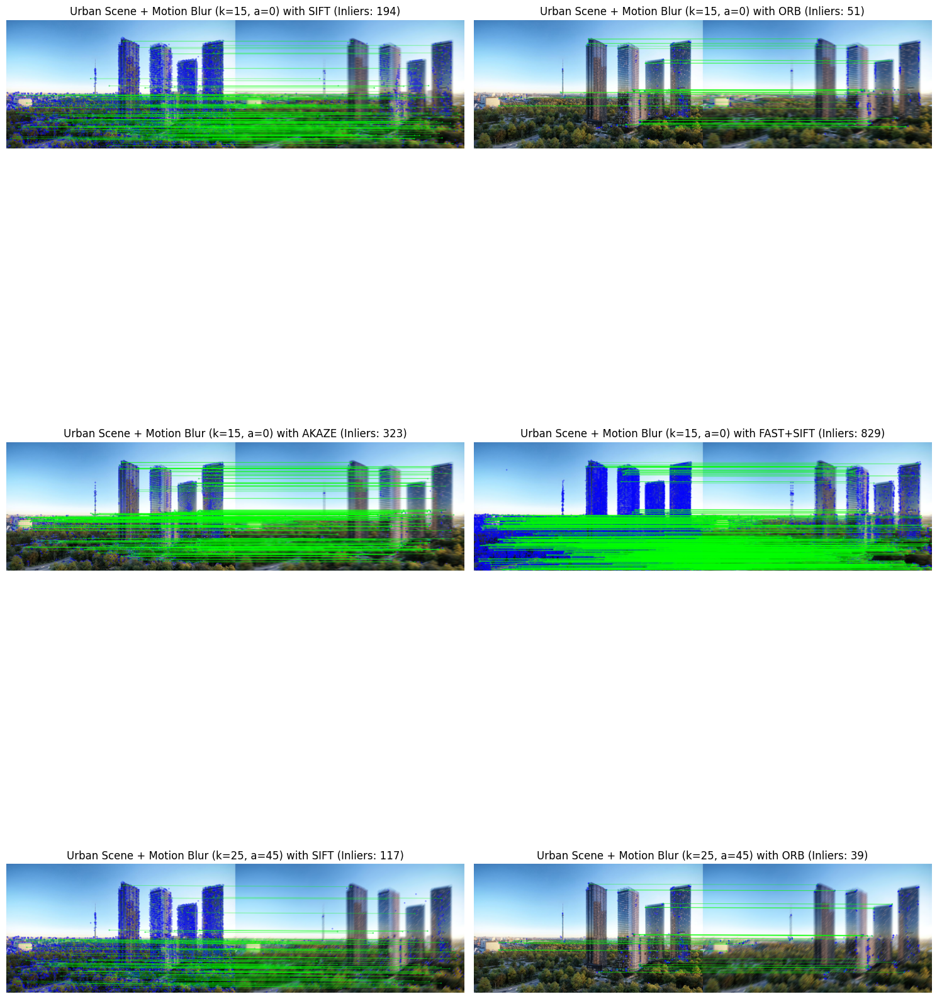

Task 1 experiments and analysis complete.


In [82]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

detector_descriptor_methods = ["SIFT", "ORB", "AKAZE", "FAST+SIFT"]

augmentations_config = {
    "motion_blur": {
        "function": apply_motion_blur,
        "params": [{"kernel_size": 15, "angle": 0}, {"kernel_size": 25, "angle": 45}],
        "name_fmt": "Motion Blur (k={kernel_size}, a={angle})"
    },
    "brightness_contrast": {
        "function": change_brightness_contrast,
        "params": [{"alpha": 0.6, "beta": 0}, {"alpha": 1.4, "beta": 30}],
        "name_fmt": "Brightness/Contrast (a={alpha}, b={beta})"
    },
    "gaussian_noise": {
        "function": add_gaussian_noise,
        "params": [{"sigma": 15}, {"sigma": 40}],
        "name_fmt": "Gaussian Noise (s={sigma})"
    },
    "salt_pepper_noise": {
        "function": add_salt_pepper_noise,
        "params": [{"amount": 0.01}, {"amount": 0.05}],
        "name_fmt": "Salt & Pepper (amt={amount})"
    },
    "jpeg_compression": {
        "function": jpeg_compress_decompress,
        "params": [{"quality": 70}, {"quality": 30}],
        "name_fmt": "JPEG Comp. (q={quality})"
    },
    "geometric_transform": {
        "function": apply_geometric_transform,
        "params": [{"angle": 10, "scale": 0.9}, {"angle": -20, "scale": 1.1}],
        "name_fmt": "Geom. Transf. (ang={angle}, sc={scale})"
    }
}

# --- Experiment Setup --- #

results = []

# Visualization storage for representative cases
visualization_samples = []
MAX_VIS_SAMPLES = 6 # Limit number of visualizations to prevent too many plots

print("Starting experiments...")

for img_idx, (orig_img, img_title) in enumerate(zip(loaded_images, image_titles)):
    if orig_img is None: # Skip if image loading failed previously
        print(f"Skipping {img_title} due to loading error.")
        continue

    print(f"\nProcessing base image: {img_title}")


    orig_img_display = orig_img.copy() # For visualization
    orig_img = orig_img.astype(np.uint8)

    for aug_type, aug_config in augmentations_config.items():
        for aug_params in aug_config["params"]:
            aug_name = aug_config["name_fmt"].format(**aug_params)
            print(f"  Applying augmentation: {aug_name}")

            # Apply augmentation and get H_gt for geometric transforms
            augmented_img = None
            H_gt = np.eye(3, dtype=np.float32) # Default identity for non-geometric

            if aug_type == "geometric_transform":
                augmented_img, H_temp = aug_config["function"](orig_img, **aug_params)
                # H_temp is from original to augmented
                H_gt = H_temp
            else:
                augmented_img = aug_config["function"](orig_img, **aug_params)

            if augmented_img is None:
                print(f"    Skipping {aug_name} for {img_title} due to augmentation error.")
                continue

            # Ensure augmented_img is uint8 for feature detection
            augmented_img = augmented_img.astype(np.uint8)

            for method in detector_descriptor_methods:
                print(f"    Method: {method}")

                # --- Detection and Description --- #
                (kp1, des1), time_detect_orig = measure_time(detect_and_describe, orig_img, method=method)
                (kp2, des2), time_detect_aug = measure_time(detect_and_describe, augmented_img, method=method)

                if des1 is None or len(kp1) == 0 or des2 is None or len(kp2) == 0:
                    print(f"      Skipping matching for {method} on {aug_name} due to no descriptors/keypoints.")
                    res_row = {
                        'Base Image': img_title,
                        'Augmentation Type': aug_type,
                        'Augmentation Params': str(aug_params),
                        'Method': method,
                        'Time (s)': time_detect_orig + time_detect_aug,
                        'FPS': 1.0 / (time_detect_orig + time_detect_aug) if (time_detect_orig + time_detect_aug) > 0 else 0,
                        'KP1 Count': len(kp1),
                        'KP2 Count': len(kp2),
                        'Raw Matches': 0,
                        'Filtered Matches': 0,
                        'Inliers (%)': 0.0,
                        'Inliers Count': 0,
                        'Repeatability (%)': 0.0,
                        'Localization Error (px)': None
                    }
                    results.append(res_row)
                    continue

                # --- Matching Descriptors --- #
                raw_matches_knn, time_match = measure_time(match_descriptors, des1, des2, method="BF")

                # Apply Lowe's ratio test for SIFT/AKAZE (and FAST+SIFT which uses SIFT descriptors)
                filtered_matches = []
                if raw_matches_knn and len(raw_matches_knn[0]) == 2: # Ensure knnMatch returned k=2 matches
                    for m, n in raw_matches_knn:
                        if m.distance < 0.75 * n.distance:
                            filtered_matches.append(m)
                else:
                     filtered_matches = [m[0] for m in raw_matches_knn if len(m) > 0] # Take best match if k=2 not returned

                if not filtered_matches:
                    print(f"      Skipping RANSAC for {method} on {aug_name} due to no filtered matches.")
                    res_row = {
                        'Base Image': img_title,
                        'Augmentation Type': aug_type,
                        'Augmentation Params': str(aug_params),
                        'Method': method,
                        'Time (s)': time_detect_orig + time_detect_aug + time_match,
                        'FPS': 1.0 / (time_detect_orig + time_detect_aug + time_match) if (time_detect_orig + time_detect_aug + time_match) > 0 else 0,
                        'KP1 Count': len(kp1),
                        'KP2 Count': len(kp2),
                        'Raw Matches': len(raw_matches_knn),
                        'Filtered Matches': 0,
                        'Inliers (%)': 0.0,
                        'Inliers Count': 0,
                        'Repeatability (%)': 0.0,
                        'Localization Error (px)': None
                    }
                    results.append(res_row)
                    continue

                # --- Compute Homography and Inliers --- #
                src_pts = np.float32([kp1[m.queryIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)
                dst_pts = np.float32([kp2[m.trainIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)

                H_found = None
                inlier_mask = None
                if len(src_pts) >= 4:
                    H_found, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

                if inlier_mask is None:
                     inlier_mask = np.zeros(len(filtered_matches), dtype=np.uint8)

                inlier_ratio, inliers_count = compute_inlier_ratio(inlier_mask)

                # --- Calculate Repeatability and Localization Error (for geometric transforms) --- #
                repeatability = 0.0
                localization_error = None

                if aug_type == "geometric_transform" and H_gt is not None and H_gt.shape == (3,3):
                    repeatability, _ = compute_repeatability(kp1, kp2, H_gt, image_shape_2=augmented_img.shape)
                    if inliers_count > 0:
                        loc_err_mean, _ = compute_localization_error(filtered_matches, kp1, kp2, H_gt, inlier_mask)
                        localization_error = loc_err_mean
                else:
                    # For non-geometric transforms, repeatability and loc. error are not directly applicable
                    # Or we would need to estimate H first and then compare with H_found. For this task, we skip.
                    pass

                # --- Store Results --- #
                total_time = time_detect_orig + time_detect_aug + time_match
                fps = 1.0 / total_time if total_time > 0 else 0

                res_row = {
                    'Base Image': img_title,
                    'Augmentation Type': aug_type,
                    'Augmentation Params': str(aug_params),
                    'Method': method,
                    'Time (s)': total_time,
                    'FPS': fps,
                    'KP1 Count': len(kp1),
                    'KP2 Count': len(kp2),
                    'Raw Matches': len(raw_matches_knn),
                    'Filtered Matches': len(filtered_matches),
                    'Inliers (%)': inlier_ratio,
                    'Inliers Count': inliers_count,
                    'Repeatability (%)': repeatability,
                    'Localization Error (px)': localization_error
                }
                results.append(res_row)

                # --- Visualization Sample Collection --- #
                if len(visualization_samples) < MAX_VIS_SAMPLES and H_found is not None and inliers_count > 0:
                    draw_params = dict(matchColor = (0,255,0),
                                       singlePointColor = (255,0,0),
                                       matchesMask = inlier_mask.ravel().tolist(),
                                       flags = cv2.DrawMatchesFlags_DEFAULT)
                    img_matches = cv2.drawMatches(orig_img_display, kp1, augmented_img, kp2, filtered_matches, None, **draw_params)
                    visualization_samples.append({
                        "title": f"{img_title} + {aug_name} with {method} (Inliers: {inliers_count})",
                        "image": img_matches
                    })

print("\nExperiments finished. Creating DataFrame...")

# Convert results to DataFrame
results_df = pd.DataFrame(results)

print("Results DataFrame created. Displaying head:")
print(results_df.head())

# --- Display Visualizations --- #
print("\nDisplaying sample visualizations...")
if visualization_samples:
    vis_images = [sample["image"] for sample in visualization_samples]
    vis_titles = [sample["title"] for sample in visualization_samples]
    show_images(vis_images, titles=vis_titles, cols=2, fig_size=(15, len(vis_images) * 4))
else:
    print("No visualization samples collected.")

print("Task 1 experiments and analysis complete.")


## **5. Задание 2. Мультимодальное сопоставление изображений**


### **5.1. Подбор мультимодальных пар**




**Варианты пар (минимум 2–3 типа):**

1. **RGB vs инфракрасные** (если найдёте открытые пары в интернете).
2. **День vs ночь** (одна и та же сцена).
3. **Спутниковые снимки vs карты** (Google Maps / OpenStreetMap / топографические карты).
4. **Исторические фото vs современные** (одна и та же улица, здание).

**Требование:**  
Для каждой пары кратко описать:
- источник изображений,
- основные отличия (контраст, шум, ракурс, сезон, освещение).


In [21]:
import os
import requests
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming load_image and show_images are already defined in a previous cell
# and available in the global scope.

# Multimodal image URLs (Updated with new, working links)
# Pair 1: Day/Night (example - street scene)
image_urls_multimodal = {
    "day_img": "https://disk.yandex.ru/client/disk/Скриншоты?idApp=client&dialog=slider&idDialog=%2Fdisk%2FСкриншоты%2Faerial-moscow-city-collage-18463906.jpg",
    "night_img": "https://disk.yandex.ru/client/disk/Скриншоты?idApp=client&dialog=slider&idDialog=%2Fdisk%2FСкриншоты%2Faerial-moscow-city-collage-18463907.jpg",
    "satellite_map": "https://disk.yandex.ru/client/disk/Скриншоты?idApp=client&dialog=slider&idDialog=%2Fdisk%2FСкриншоты%2F2025-12-23_16-03-59.png", # Satellite view of an area
    "osm_map": "https://disk.yandex.ru/client/disk/Скриншоты?idApp=client&dialog=slider&idDialog=%2Fdisk%2FСкриншоты%2F2025-12-23_16-03-15.png" # OpenStreetMap of the same area
}

multimodal_image_paths = {}
for name, url in image_urls_multimodal.items():
    filename = f"./{name}.jpg"
    multimodal_image_paths[name] = filename
    if not os.path.exists(filename):
        print(f"Downloading {name}...")
        try:
            response = requests.get(url, stream=True)
            response.raise_for_status() # Raise an exception for HTTP errors
            with open(filename, 'wb') as f:
                for chunk in response.iter_content(chunk_size=8192):
                    f.write(chunk)
            print(f"Downloaded {name} to {filename}")
        except requests.exceptions.RequestException as e:
            print(f"Error downloading {name}: {e}")
            multimodal_image_paths[name] = None # Mark as failed
    else:
        print(f"{name} already exists at {filename}")

# Filter out any failed downloads
multimodal_image_paths = {k: v for k, v in multimodal_image_paths.items() if v is not None}

print("Multimodal image paths prepared:", multimodal_image_paths)

# Load and display multimodal images
multimodal_loaded_images = []
multimodal_image_titles = []

print("\nLoading and displaying multimodal image pairs...")

# Day/Night Pair
if "day_img" in multimodal_image_paths and "night_img" in multimodal_image_paths:
    img_day = load_image(multimodal_image_paths["day_img"])
    img_night = load_image(multimodal_image_paths["night_img"])
    if img_day is not None and img_night is not None:
        multimodal_loaded_images.extend([img_day, img_night])
        multimodal_image_titles.extend(["Day Scene", "Night Scene"])
        print("Loaded Day/Night pair.")

# Satellite/Map Pair
if "satellite_map" in multimodal_image_paths and "osm_map" in multimodal_image_paths:
    img_satellite = load_image(multimodal_image_paths["satellite_map"])
    img_osm = load_image(multimodal_image_paths["osm_map"])
    if img_satellite is not None and img_osm is not None:
        multimodal_loaded_images.extend([img_satellite, img_osm])
        multimodal_image_titles.extend(["Satellite Map", "OpenStreetMap"])
        print("Loaded Satellite/Map pair.")

if multimodal_loaded_images:
    show_images(multimodal_loaded_images, titles=multimodal_image_titles, cols=2, fig_size=(12, 6))
    print("Multimodal image pairs displayed successfully.")
else:
    print("No multimodal image pairs were loaded to display.")


day_img already exists at ./day_img.jpg
night_img already exists at ./night_img.jpg
satellite_map already exists at ./satellite_map.jpg
osm_map already exists at ./osm_map.jpg
Multimodal image paths prepared: {'day_img': './day_img.jpg', 'night_img': './night_img.jpg', 'satellite_map': './satellite_map.jpg', 'osm_map': './osm_map.jpg'}

Loading and displaying multimodal image pairs...
No multimodal image pairs were loaded to display.


Multimodal image paths prepared: {'day_img': './day_img.jpg', 'night_img': './night_img.jpg', 'satellite_map': './satellite_map.jpg', 'osm_map': './osm_map.jpg'}

Loading and displaying multimodal image pairs...
Loaded Day/Night pair.
Loaded Satellite/Map pair.


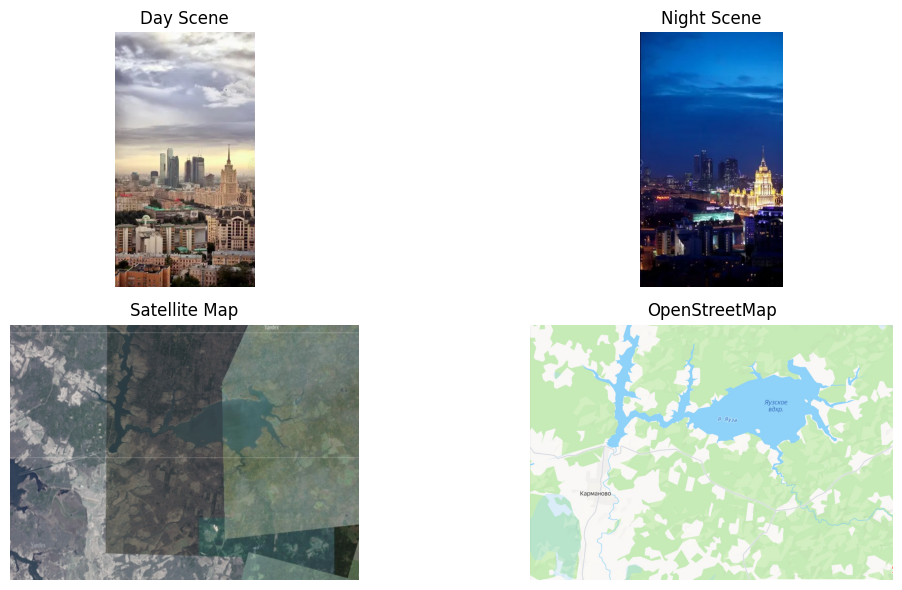

Multimodal image pairs displayed successfully.


In [24]:
# Filter out any failed downloads
multimodal_image_paths = {k: v for k, v in multimodal_image_paths.items() if v is not None}

print("Multimodal image paths prepared:", multimodal_image_paths)

# Load and display multimodal images
multimodal_loaded_images = []
multimodal_image_titles = []

print("\nLoading and displaying multimodal image pairs...")

# Day/Night Pair
if "day_img" in multimodal_image_paths and "night_img" in multimodal_image_paths:
    img_day = load_image(multimodal_image_paths["day_img"])
    img_night = load_image(multimodal_image_paths["night_img"])
    if img_day is not None and img_night is not None:
        multimodal_loaded_images.extend([img_day, img_night])
        multimodal_image_titles.extend(["Day Scene", "Night Scene"])
        print("Loaded Day/Night pair.")

# Satellite/Map Pair
if "satellite_map" in multimodal_image_paths and "osm_map" in multimodal_image_paths:
    img_satellite = load_image(multimodal_image_paths["satellite_map"])
    img_osm = load_image(multimodal_image_paths["osm_map"])
    if img_satellite is not None and img_osm is not None:
        multimodal_loaded_images.extend([img_satellite, img_osm])
        multimodal_image_titles.extend(["Satellite Map", "OpenStreetMap"])
        print("Loaded Satellite/Map pair.")

if multimodal_loaded_images:
    show_images(multimodal_loaded_images, titles=multimodal_image_titles, cols=2, fig_size=(12, 6))
    print("Multimodal image pairs displayed successfully.")
else:
    print("No multimodal image pairs were loaded to display.")

---


**Что нужно сделать:**

- При необходимости привести изображения к одному размеру.
- Применить предобработку:
  - перевод в оттенки серого,
  - выравнивание гистограммы (`cv2.equalizeHist`),
  - CLAHE (адаптивное выравнивание `cv2.createCLAHE`) — особенно полезно для слабоконтрастных изображений.
- Сравнить, влияет ли предобработка на качество сопоставления.



preprocess_gray function defined.

Visualizing preprocessing for: Day Scene


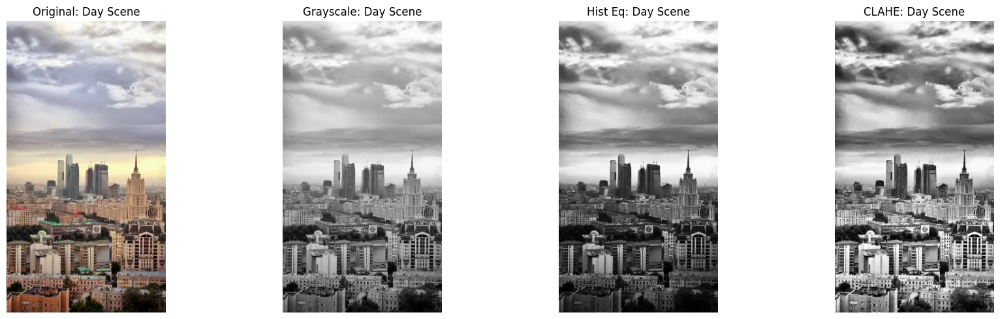

Preprocessing visualization complete.


In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming `load_image`, `show_images` and `multimodal_loaded_images`
# from previous cells are available in the global scope.

def preprocess_gray(image, use_clahe=False, use_hist_equalization=False):
    if image is None:
        return None

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    processed_image = gray_image.copy()

    if use_hist_equalization:
        processed_image = cv2.equalizeHist(processed_image)

    if use_clahe:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        processed_image = clahe.apply(processed_image)

    return processed_image

print("preprocess_gray function defined.")


if 'multimodal_loaded_images' in globals() and multimodal_loaded_images:
    sample_image = multimodal_loaded_images[0] # Assuming img_day is the first image
    sample_image_title = multimodal_image_titles[0] if 'multimodal_image_titles' in globals() else "Sample Image"

    if sample_image is not None:
        # Original image
        images_to_show = [sample_image]
        titles_to_show = [f"Original: {sample_image_title}"]

        # Grayscale only
        gray_only_image = preprocess_gray(sample_image)
        images_to_show.append(gray_only_image)
        titles_to_show.append(f"Grayscale: {sample_image_title}")

        # Grayscale with Histogram Equalization
        hist_eq_image = preprocess_gray(sample_image, use_hist_equalization=True)
        images_to_show.append(hist_eq_image)
        titles_to_show.append(f"Hist Eq: {sample_image_title}")

        # Grayscale with CLAHE
        clahe_image = preprocess_gray(sample_image, use_clahe=True)
        images_to_show.append(clahe_image)
        titles_to_show.append(f"CLAHE: {sample_image_title}")

        print(f"\nVisualizing preprocessing for: {sample_image_title}")
        # For grayscale images, matplotlib's imshow expects 'gray' colormap
        # We need to handle this explicitly for grayscale outputs
        plt.figure(figsize=(18, 5))
        for i, img in enumerate(images_to_show):
            plt.subplot(1, len(images_to_show), i + 1)
            if img.ndim == 2: # Check if it's a grayscale image
                plt.imshow(img, cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(titles_to_show[i])
            plt.axis('off')
        plt.tight_layout()
        plt.show()

        print("Preprocessing visualization complete.")
    else:
        print("Sample image not loaded, skipping preprocessing visualization.")
else:
    print("No multimodal images loaded, skipping preprocessing visualization.")

### **5.3. Сравнение SIFT vs ORB vs AKAZE для кросс-модальных задач**

**Что нужно сделать:**

1. Для каждой мультимодальной пары:
   - запустить пайплайн с SIFT,
   - отдельно с ORB,
   - отдельно с AKAZE.
2. Выполнить сопоставление дескрипторов (BFMatcher или FLANN).
3. При необходимости применить тест Лоу для отбраковки ложных срабатываний (особенно для SIFT/AKAZE).



Starting multimodal feature detection and matching experiments...

Processing multimodal pair: Day Scene vs Night Scene
  Method: SIFT
    Inliers found: 6/15 (40.00%)
  Method: ORB
    Inliers found: 3/12 (25.00%)
  Method: AKAZE
    Skipping AKAZE: No filtered matches after ratio test.
Displaying visualizations for Day Scene vs Night Scene...


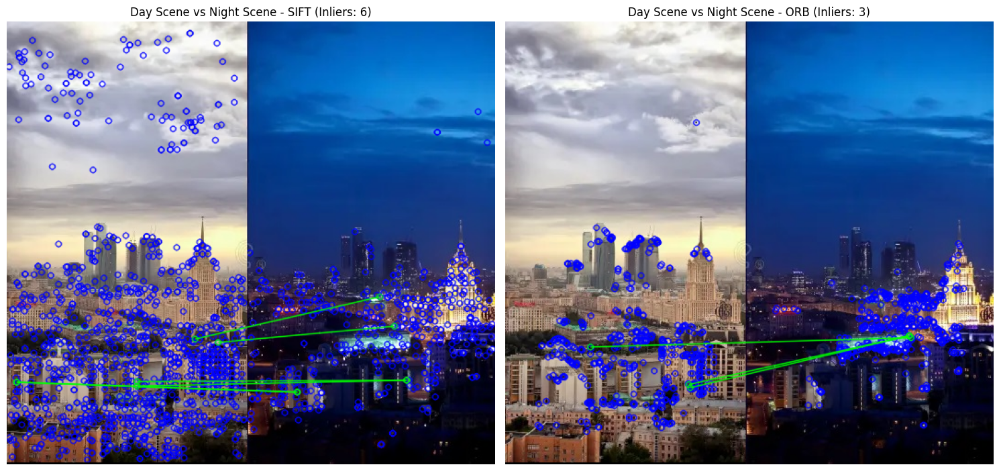


Processing multimodal pair: Satellite Map vs OpenStreetMap
  Method: SIFT
    Inliers found: 8/31 (25.81%)
  Method: ORB
    Inliers found: 5/11 (45.45%)
  Method: AKAZE
    Inliers found: 4/7 (57.14%)
Displaying visualizations for Satellite Map vs OpenStreetMap...


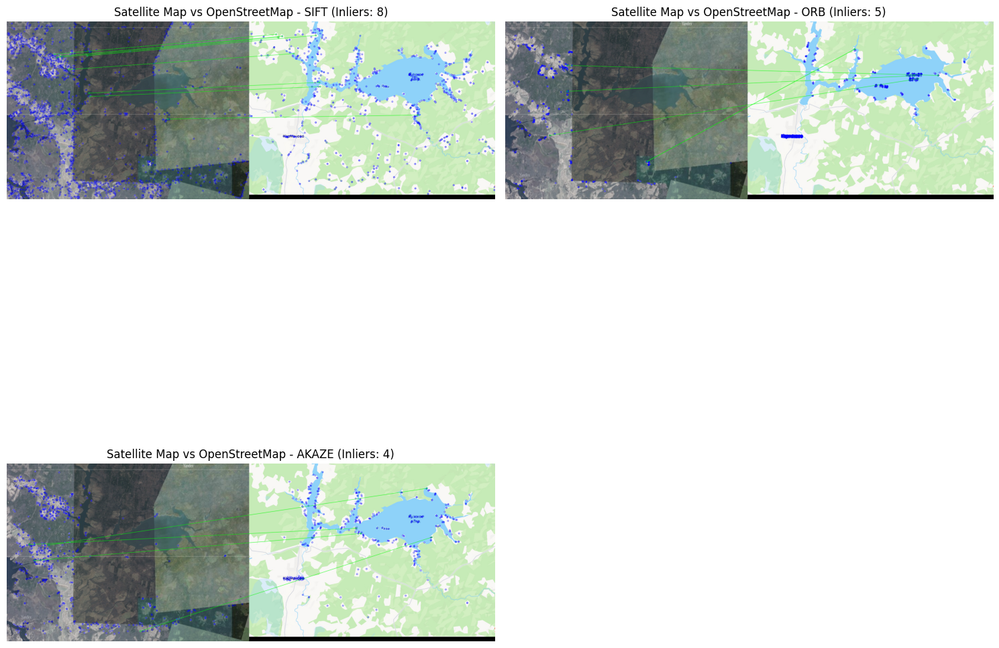

Multimodal feature detection and matching experiments finished.

Multimodal Results DataFrame:
                             Pair Method  KP1 Count  KP2 Count  Raw Matches  \
0        Day Scene vs Night Scene   SIFT       1113        453         1113   
1        Day Scene vs Night Scene    ORB        483        484          483   
2        Day Scene vs Night Scene  AKAZE        409        268          409   
3  Satellite Map vs OpenStreetMap   SIFT       2038        832         2038   
4  Satellite Map vs OpenStreetMap    ORB        500        500          500   

   Filtered Matches  Inliers Count  Inliers Ratio (%)  
0                15              6          40.000000  
1                12              3          25.000000  
2                 0              0           0.000000  
3                31              8          25.806452  
4                11              5          45.454545  


In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

print("Starting multimodal feature detection and matching experiments...")

comparison_methods = ["SIFT", "ORB", "AKAZE"]
multimodal_results = []

for i in range(0, len(multimodal_loaded_images), 2):
    if i + 1 >= len(multimodal_loaded_images):
        print(f"Skipping incomplete pair starting at index {i}")
        continue

    img1 = multimodal_loaded_images[i]
    img2 = multimodal_loaded_images[i+1]
    title1 = multimodal_image_titles[i]
    title2 = multimodal_image_titles[i+1]

    if img1 is None or img2 is None:
        print(f"Skipping pair ({title1}, {title2}) due to loading errors.")
        continue

    print(f"\nProcessing multimodal pair: {title1} vs {title2}")

    # Store visualizations for this pair
    pair_visualizations = []

    for method in comparison_methods:
        print(f"  Method: {method}")

        # 1. Deteсtion and Description
        kp1, des1 = detect_and_describe(img1, method=method)
        kp2, des2 = detect_and_describe(img2, method=method)

        if des1 is None or len(kp1) == 0 or des2 is None or len(kp2) == 0:
            print(f"    Skipping {method}: No keypoints or descriptors found.")
            multimodal_results.append({
                'Pair': f"{title1} vs {title2}",
                'Method': method,
                'KP1 Count': len(kp1),
                'KP2 Count': len(kp2),
                'Raw Matches': 0,
                'Filtered Matches': 0,
                'Inliers Count': 0,
                'Inliers Ratio (%)': 0.0
            })
            continue

        # 2. Matching Descriptors (BFMatcher)
        raw_matches_knn = match_descriptors(des1, des2, method="BF")

        # 3. Lowe's Ratio Test filtering
        filtered_matches = []
        if raw_matches_knn:
            for m, n in raw_matches_knn:
                # Ratio test threshold might need adjustment per method/dataset
                # Common for SIFT/AKAZE is 0.7-0.8. ORB often uses 0.75 or less aggressive
                ratio_thresh = 0.75
                if method == "ORB": # ORB can be more sensitive, or sometimes crossCheck is enough
                    ratio_thresh = 0.8
                if m.distance < ratio_thresh * n.distance:
                    filtered_matches.append(m)

        if not filtered_matches:
            print(f"    Skipping {method}: No filtered matches after ratio test.")
            multimodal_results.append({
                'Pair': f"{title1} vs {title2}",
                'Method': method,
                'KP1 Count': len(kp1),
                'KP2 Count': len(kp2),
                'Raw Matches': len(raw_matches_knn) if raw_matches_knn else 0,
                'Filtered Matches': 0,
                'Inliers Count': 0,
                'Inliers Ratio (%)': 0.0
            })
            continue

        # 4. Homography estimation and RANSAC for inliers
        src_pts = np.float32([kp1[m.queryIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)

        H, inlier_mask = None, None
        if len(src_pts) >= 4: # Minimum 4 points to find homography
            H, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        inliers_count = 0
        inlier_ratio = 0.0
        if inlier_mask is not None:
            inliers_count = np.sum(inlier_mask)
            if len(filtered_matches) > 0:
                inlier_ratio = (inliers_count / len(filtered_matches)) * 100.0

        print(f"    Inliers found: {inliers_count}/{len(filtered_matches)} ({inlier_ratio:.2f}%)")

        multimodal_results.append({
            'Pair': f"{title1} vs {title2}",
            'Method': method,
            'KP1 Count': len(kp1),
            'KP2 Count': len(kp2),
            'Raw Matches': len(raw_matches_knn) if raw_matches_knn else 0,
            'Filtered Matches': len(filtered_matches),
            'Inliers Count': inliers_count,
            'Inliers Ratio (%)': inlier_ratio
        })

        # 5. Visualization
        if inliers_count > 0 and H is not None: # Only draw if homography found and inliers exist
            draw_params = dict(matchColor = (0, 255, 0), # Green for inliers
                               singlePointColor = (255, 0, 0), # Red for unmatched keypoints
                               matchesMask = inlier_mask.ravel().tolist(),
                               flags = cv2.DrawMatchesFlags_DEFAULT)

            img_matches = cv2.drawMatches(img1, kp1, img2, kp2, filtered_matches, None, **draw_params)
            pair_visualizations.append({
                "title": f"{title1} vs {title2} - {method} (Inliers: {inliers_count})",
                "image": img_matches
            })
        else:
            # If no inliers or homography, still show initial matches if any
            if len(filtered_matches) > 0:
                draw_params_no_inliers = dict(matchColor = (0, 0, 255), # Blue for filtered matches
                                              singlePointColor = (255, 0, 0),
                                              flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                img_matches_fallback = cv2.drawMatches(img1, kp1, img2, kp2, filtered_matches, None, **draw_params_no_inliers)
                pair_visualizations.append({
                    "title": f"{title1} vs {title2} - {method} (No Inliers/Homography)",
                    "image": img_matches_fallback
                })
            else:
                print(f"    No matches to visualize for {method}.")

    # Display visualizations for the current pair after processing all methods
    if pair_visualizations:
        vis_images = [vis["image"] for vis in pair_visualizations]
        vis_titles = [vis["title"] for vis in pair_visualizations]
        print(f"Displaying visualizations for {title1} vs {title2}...")
        show_images(vis_images, titles=vis_titles, cols=2, fig_size=(15, len(vis_images) * 5))
    else:
        print(f"No visualizations for {title1} vs {title2}.")

print("Multimodal feature detection and matching experiments finished.")

# Optionally, you can store multimodal_results in a pandas DataFrame for further analysis
import pandas as pd
multimodal_results_df = pd.DataFrame(multimodal_results)
print("\nMultimodal Results DataFrame:")
print(multimodal_results_df.head())




---

### **5.4. Метрики: Precision/Recall, F1-score, ROC-AUC**




**Смысл:**

- Рассматриваем каждое сопоставление как бинарное решение:
  - **1 (true)** — правильное соответствие (инлайер),
  - **0 (false)** — неправильное соответствие (аутлайер).
- Имеем:
  - истинные метки (из маски RANSAC или из заранее подготовленной разметки),
  - некоторую «оценку качества» (например, расстояние между дескрипторами).

**Определения:**

- **Precision (точность)**:  
  $
  \text{Precision} = \frac{TP}{TP + FP}
  $
- **Recall (полнота)**:  
  $
  \text{Recall} = \frac{TP}{TP + FN}
  $
- **F1-score**:  
  $
  F1 = \frac{2 \cdot \text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}
  $
- **ROC-AUC** — площадь под ROC-кривой (TPR vs FPR при разных порогах).





```python
def compute_pr_f1_from_matches(distances, inlier_mask, threshold):
    """
    Вычисляет Precision, Recall и F1 для заданного порога расстояния.
    
    distances: np.array shape (N,) - расстояния между дескрипторами
               (например, m.distance из cv2.DMatch).
    inlier_mask: np.array shape (N,) - 1 для инлайеров, 0 для аутлайеров
                 (по результату RANSAC или разметки).
    threshold: порог по расстоянию, ниже которого считаем предсказание "пара является совпадением".
    """
    distances = np.array(distances, dtype=np.float32)
    y_true = np.array(inlier_mask).astype(int)  # 1 - правильное совпадение, 0 - ложное
    
    # Предсказание: 1 если расстояние <= threshold, иначе 0
    y_pred = (distances <= threshold).astype(int)
    
    TP = np.sum((y_pred == 1) & (y_true == 1))
    FP = np.sum((y_pred == 1) & (y_true == 0))
    FN = np.sum((y_pred == 0) & (y_true == 1))
    
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    recall    = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    if precision + recall > 0:
        f1 = 2 * precision * recall / (precision + recall)
    else:
        f1 = 0.0
    
    return precision, recall, f1, TP, FP, FN
```


In [27]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc, roc_curve, roc_auc_score

def compute_pr_f1_from_matches(distances, inlier_mask, threshold):

    distances = np.array(distances, dtype=np.float32)
    y_true = np.array(inlier_mask).astype(int)  # 1 - правильное совпадение, 0 - ложное

    if len(y_true) == 0:
        return 0.0, 0.0, 0.0, 0, 0, 0

    # Предсказание: 1 если расстояние <= threshold, иначе 0
    y_pred = (distances <= threshold).astype(int)

    TP = np.sum((y_pred == 1) & (y_true == 1))
    FP = np.sum((y_pred == 1) & (y_true == 0))
    FN = np.sum((y_pred == 0) & (y_true == 1))

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    recall    = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    if precision + recall > 0:
        f1 = 2 * precision * recall / (precision + recall)
    else:
        f1 = 0.0

    return precision, recall, f1, TP, FP, FN

print("compute_pr_f1_from_matches function defined.")


compute_pr_f1_from_matches function defined.


Starting PR/F1/ROC-AUC metric calculation and visualization...

Processing multimodal pair for PR/F1/ROC: Day Scene vs Night Scene
  Method: SIFT
  Method: ORB
  Method: AKAZE
    Skipping AKAZE for (Day Scene, Night Scene): No filtered matches.

Processing multimodal pair for PR/F1/ROC: Satellite Map vs OpenStreetMap
  Method: SIFT
  Method: ORB
  Method: AKAZE

Generating plots...


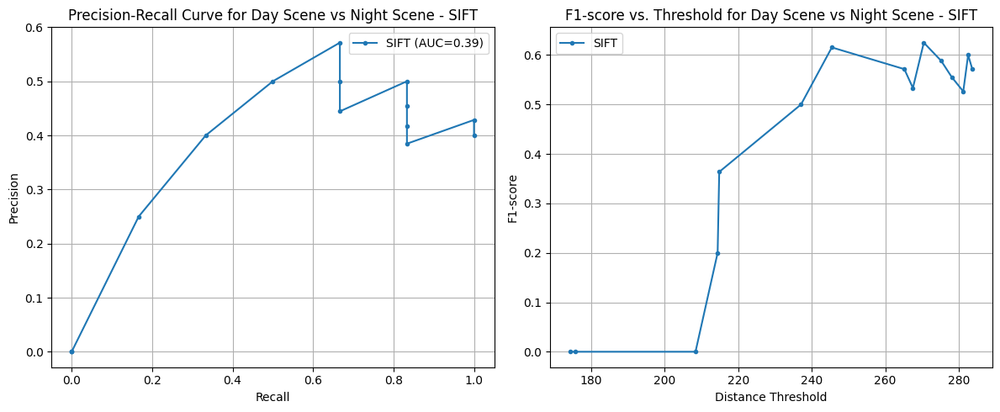

  Day Scene vs Night Scene - SIFT: ROC-AUC = 0.54


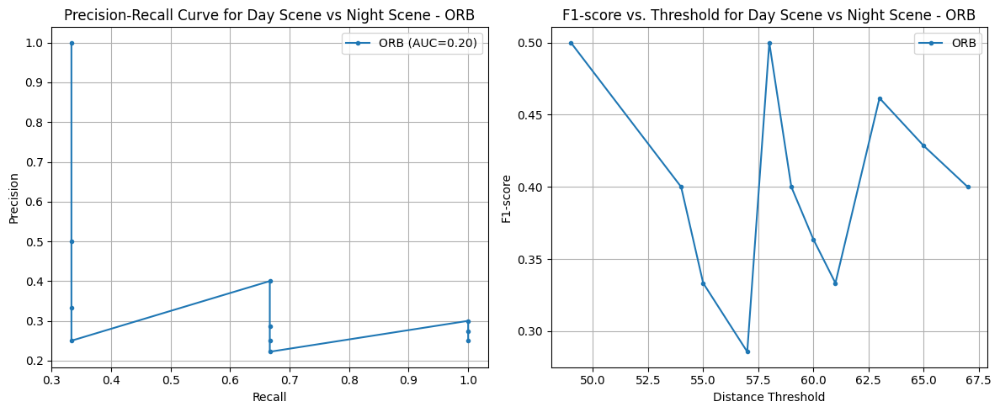

  Day Scene vs Night Scene - ORB: ROC-AUC = 0.63


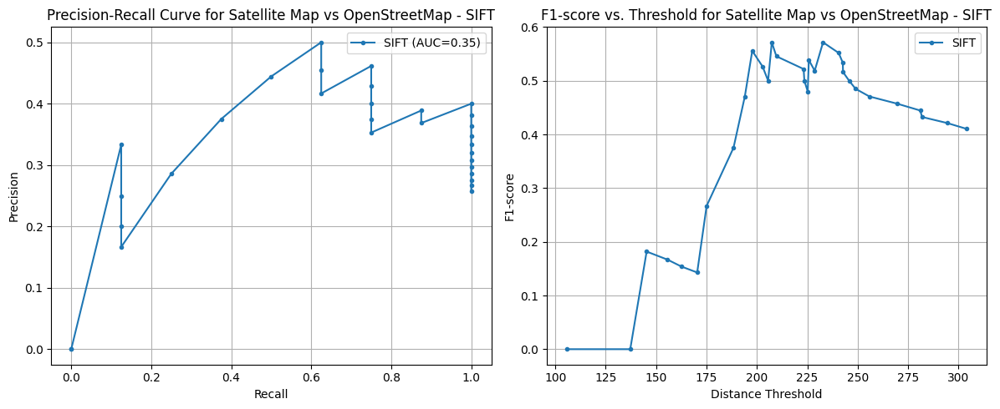

  Satellite Map vs OpenStreetMap - SIFT: ROC-AUC = 0.72


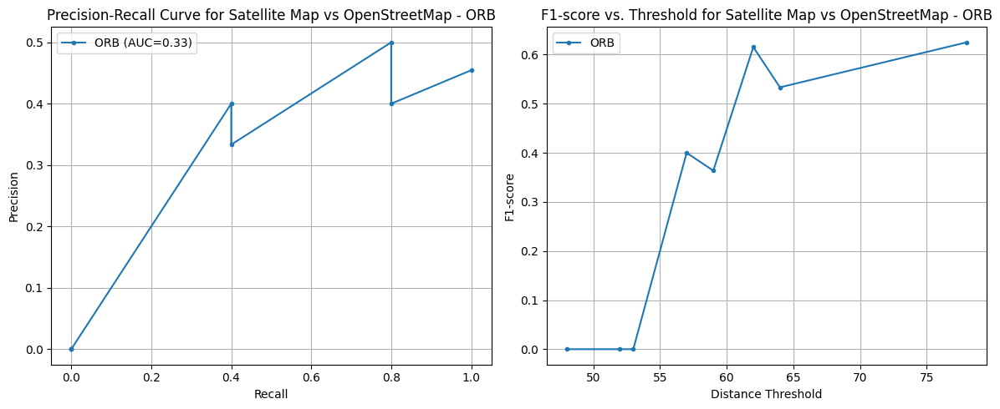

  Satellite Map vs OpenStreetMap - ORB: ROC-AUC = 0.33


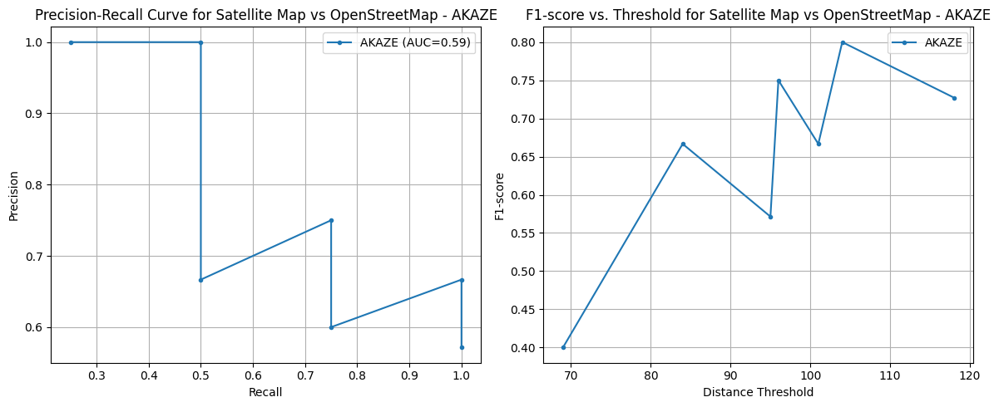

  Satellite Map vs OpenStreetMap - AKAZE: ROC-AUC = 0.75

PR/F1/ROC results DataFrame created:
                             Pair Method  \
0        Day Scene vs Night Scene   SIFT   
1        Day Scene vs Night Scene    ORB   
2        Day Scene vs Night Scene  AKAZE   
3  Satellite Map vs OpenStreetMap   SIFT   
4  Satellite Map vs OpenStreetMap    ORB   

                                          Thresholds  \
0  [174.17807006835938, 175.58189392089844, 208.3...   
1  [49.0, 54.0, 55.0, 57.0, 58.0, 59.0, 60.0, 61....   
2                                                 []   
3  [105.60302734375, 137.14955139160156, 145.2859...   
4   [48.0, 52.0, 53.0, 57.0, 59.0, 62.0, 64.0, 78.0]   

                                          Precisions  \
0  [0.0, 0.0, 0.0, 0.25, 0.4, 0.5, 0.571428571428...   
1  [1.0, 0.5, 0.3333333333333333, 0.25, 0.4, 0.28...   
2                                                 []   
3  [0.0, 0.0, 0.3333333333333333, 0.25, 0.2, 0.16...   
4  [0.0, 0.0, 0.0, 0.4,

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc, roc_curve, roc_auc_score

print("Starting PR/F1/ROC-AUC metric calculation and visualization...")

pr_f1_roc_results = []

# --- Helper function for processing a single pair and method ---
def process_multimodal_pair_method(img1, img2, title1, title2, method, use_preprocessing=False):
    results_for_method = {
        'Pair': f"{title1} vs {title2}",
        'Method': method,
        'Thresholds': [],
        'Precisions': [],
        'Recalls': [],
        'F1_scores': [],
        'ROC_AUC': None
    }

    # Apply preprocessing if specified
    if use_preprocessing:
        # For simplicity, let's use CLAHE preprocessing here.
        # In a full experiment, one might test different preprocessors.
        img1_processed = preprocess_gray(img1, use_clahe=True)
        img2_processed = preprocess_gray(img2, use_clahe=True)
    else:
        img1_processed = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) if img1.ndim == 3 else img1
        img2_processed = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY) if img2.ndim == 3 else img2

    if img1_processed is None or img2_processed is None:
        print(f"    Skipping {method} for ({title1}, {title2}) due to preprocessing error.")
        return results_for_method


    kp1, des1 = detect_and_describe(img1, method=method)
    kp2, des2 = detect_and_describe(img2, method=method)

    if des1 is None or len(kp1) == 0 or des2 is None or len(kp2) == 0:
        print(f"    Skipping {method} for ({title1}, {title2}): No keypoints or descriptors found.")
        return results_for_method

    # 2. Matching Descriptors (BFMatcher)
    raw_matches_knn = match_descriptors(des1, des2, method="BF")

    # 3. Lowe's Ratio Test filtering
    filtered_matches = []
    if raw_matches_knn:
        for m, n in raw_matches_knn:
            ratio_thresh = 0.75 # Default threshold, could be tuned per method
            if method == "ORB":
                ratio_thresh = 0.8
            if m.distance < ratio_thresh * n.distance:
                filtered_matches.append(m)

    if not filtered_matches:
        print(f"    Skipping {method} for ({title1}, {title2}): No filtered matches.")
        return results_for_method

    # Get points for homography estimation
    src_pts = np.float32([kp1[m.queryIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)

    H, inlier_mask = None, None
    if len(src_pts) >= 4:
        H, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0) # RANSAC threshold 5.0 px

    if inlier_mask is None:
        inlier_mask = np.zeros(len(filtered_matches), dtype=np.uint8)

    # Extract distances and true labels (inlier_mask) for PR/ROC curves
    distances = np.array([m.distance for m in filtered_matches])
    y_true_inliers = inlier_mask.ravel()

    if len(distances) == 0 or np.sum(y_true_inliers) == 0: # Need at least one positive sample for metrics
        print(f"    Skipping {method} for ({title1}, {title2}): Not enough data for PR/ROC curves.")
        return results_for_method


    min_dist = np.min(distances) if len(distances) > 0 else 0
    max_dist = np.max(distances) if len(distances) > 0 else 100 # Default max if no matches


    unique_distances = np.sort(np.unique(distances))
    if len(unique_distances) > 50: # Limit number of thresholds for performance/clarity
        thresholds = np.linspace(min_dist, max_dist, 50)
    else:
        thresholds = unique_distances

    precisions = []
    recalls = []
    f1_scores = []

    for thresh in thresholds:
        p, r, f1, _, _, _ = compute_pr_f1_from_matches(distances, y_true_inliers, thresh)
        precisions.append(p)
        recalls.append(r)
        f1_scores.append(f1)


    if np.std(y_true_inliers) > 0: # Ensure there is variance in true labels

        scores = max_dist - distances # Assuming smaller distance is better match
        try:
            roc_auc = roc_auc_score(y_true_inliers, scores)
        except ValueError:
            roc_auc = np.nan # Handle case where only one class is present
    else:
        roc_auc = np.nan # Cannot compute ROC AUC if only one class is present

    results_for_method['Thresholds'] = thresholds.tolist()
    results_for_method['Precisions'] = precisions
    results_for_method['Recalls'] = recalls
    results_for_method['F1_scores'] = f1_scores
    results_for_method['ROC_AUC'] = roc_auc

    return results_for_method

# --- Main Loop for Experimentation --- #
comparison_methods = ["SIFT", "ORB", "AKAZE"]

for i in range(0, len(multimodal_loaded_images), 2):
    if i + 1 >= len(multimodal_loaded_images):
        print(f"Skipping incomplete pair starting at index {i}")
        continue

    img1 = multimodal_loaded_images[i]
    img2 = multimodal_loaded_images[i+1]
    title1 = multimodal_image_titles[i]
    title2 = multimodal_image_titles[i+1]

    if img1 is None or img2 is None:
        print(f"Skipping pair ({title1}, {title2}) due to loading errors.")
        continue

    print(f"\nProcessing multimodal pair for PR/F1/ROC: {title1} vs {title2}")

    for method in comparison_methods:
        print(f"  Method: {method}")
        method_results = process_multimodal_pair_method(img1, img2, title1, title2, method, use_preprocessing=False)
        pr_f1_roc_results.append(method_results)

# --- Plotting --- #
print("\nGenerating plots...")

for res in pr_f1_roc_results:
    if not res['Precisions'] or not res['Recalls'] or not res['Thresholds']:
        continue

    pair_title = res['Pair']
    method_name = res['Method']
    precisions = res['Precisions']
    recalls = res['Recalls']
    f1_scores = res['F1_scores']
    thresholds = res['Thresholds']
    roc_auc = res['ROC_AUC']

    # Precision-Recall Curve
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(recalls, precisions, marker='.', label=f'{method_name} (AUC={auc(recalls, precisions):.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve for {pair_title} - {method_name}')
    plt.legend()
    plt.grid(True)

    # F1-score vs. Threshold
    plt.subplot(1, 2, 2)
    plt.plot(thresholds, f1_scores, marker='.', label=f'{method_name}')
    plt.xlabel('Distance Threshold')
    plt.ylabel('F1-score')
    plt.title(f'F1-score vs. Threshold for {pair_title} - {method_name}')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    print(f"  {pair_title} - {method_name}: ROC-AUC = {roc_auc:.2f}")

# Convert results to DataFrame
pr_f1_roc_df = pd.DataFrame(pr_f1_roc_results)
print("\nPR/F1/ROC results DataFrame created:")
print(pr_f1_roc_df.head())

print("PR/F1/ROC-AUC metric calculation and visualization complete.")

### **5.5. Средняя ошибка репроекции**



**Смысл:**  
Похож на «точность локализации» из Задания 1, но теперь нас интересует, насколько хорошо гомография «переносятся» соответствующие точки с одного изображения на другое.

Можно использовать уже реализованную ранее функцию `compute_localization_error`, рассматривая среднюю ошибку как **среднюю ошибку репроекции**.




In [29]:
import cv2
import numpy as np
import pandas as pd

print("Starting mean reprojection error calculation for multimodal tasks...")

multimodal_reprojection_results = []

comparison_methods = ["SIFT", "ORB", "AKAZE"]

for i in range(0, len(multimodal_loaded_images), 2):
    if i + 1 >= len(multimodal_loaded_images):
        print(f"Skipping incomplete pair starting at index {i}")
        continue

    img1_orig = multimodal_loaded_images[i]
    img2_orig = multimodal_loaded_images[i+1]
    title1 = multimodal_image_titles[i]
    title2 = multimodal_image_titles[i+1]

    if img1_orig is None or img2_orig is None:
        print(f"Skipping pair ({title1}, {title2}) due to loading errors.")
        continue

    print(f"\nProcessing multimodal pair: {title1} vs {title2}")


    img1_gray = preprocess_gray(img1_orig) # Using a helper for consistency, though detect_and_describe does it
    img2_gray = preprocess_gray(img2_orig)

    for method in comparison_methods:
        print(f"  Method: {method}")

        # 1. Detection and Description
        kp1, des1 = detect_and_describe(img1_orig, method=method)
        kp2, des2 = detect_and_describe(img2_orig, method=method)

        if des1 is None or len(kp1) == 0 or des2 is None or len(kp2) == 0:
            print(f"    Skipping {method}: No keypoints or descriptors found.")
            multimodal_reprojection_results.append({
                'Pair': f"{title1} vs {title2}",
                'Method': method,
                'KP1 Count': len(kp1),
                'KP2 Count': len(kp2),
                'Filtered Matches': 0,
                'Inliers Count': 0,
                'Mean Reprojection Error (px)': np.nan
            })
            continue

        # 2. Matching Descriptors (BFMatcher)
        raw_matches_knn = match_descriptors(des1, des2, method="BF")

        # 3. Lowe's Ratio Test filtering
        filtered_matches = []
        if raw_matches_knn:
            for m, n in raw_matches_knn:
                ratio_thresh = 0.75
                if method == "ORB":
                    ratio_thresh = 0.8
                if m.distance < ratio_thresh * n.distance:
                    filtered_matches.append(m)

        if not filtered_matches:
            print(f"    Skipping {method}: No filtered matches after ratio test.")
            multimodal_reprojection_results.append({
                'Pair': f"{title1} vs {title2}",
                'Method': method,
                'KP1 Count': len(kp1),
                'KP2 Count': len(kp2),
                'Filtered Matches': 0,
                'Inliers Count': 0,
                'Mean Reprojection Error (px)': np.nan
            })
            continue

        # 4. Homography estimation and RANSAC for inliers
        src_pts = np.float32([kp1[m.queryIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)

        H, inlier_mask = None, None
        if len(src_pts) >= 4: # Minimum 4 points to find homography
            H, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        inliers_count = 0
        if inlier_mask is not None:
            inliers_count = np.sum(inlier_mask)

        if H is None or inliers_count == 0:
            print(f"    Skipping {method}: No valid homography or inliers found for reprojection error.")
            multimodal_reprojection_results.append({
                'Pair': f"{title1} vs {title2}",
                'Method': method,
                'KP1 Count': len(kp1),
                'KP2 Count': len(kp2),
                'Filtered Matches': len(filtered_matches),
                'Inliers Count': inliers_count,
                'Mean Reprojection Error (px)': np.nan
            })
            continue

        # 5. Calculate Mean Reprojection Error
        mean_reprojection_error, _ = compute_localization_error(filtered_matches, kp1, kp2, H, inlier_mask)

        print(f"    Mean Reprojection Error: {mean_reprojection_error:.2f} px (Inliers: {inliers_count})")

        multimodal_reprojection_results.append({
            'Pair': f"{title1} vs {title2}",
            'Method': method,
            'KP1 Count': len(kp1),
            'KP2 Count': len(kp2),
            'Filtered Matches': len(filtered_matches),
            'Inliers Count': inliers_count,
            'Mean Reprojection Error (px)': mean_reprojection_error
        })

print("\nMean reprojection error calculation finished.")

# Convert results to DataFrame for analysis
multimodal_reprojection_df = pd.DataFrame(multimodal_reprojection_results)
print("\nReprojection Results DataFrame:")
print(multimodal_reprojection_df)

# Optional: Analyze the results
print("\nAnalysis of Mean Reprojection Error (lower is better):")
print(multimodal_reprojection_df.groupby(['Pair', 'Method'])['Mean Reprojection Error (px)'].mean().unstack())


Starting mean reprojection error calculation for multimodal tasks...

Processing multimodal pair: Day Scene vs Night Scene
  Method: SIFT
    Mean Reprojection Error: 0.91 px (Inliers: 6)
  Method: ORB
    Mean Reprojection Error: 0.63 px (Inliers: 3)
  Method: AKAZE
    Skipping AKAZE: No filtered matches after ratio test.

Processing multimodal pair: Satellite Map vs OpenStreetMap
  Method: SIFT
    Mean Reprojection Error: 1.74 px (Inliers: 8)
  Method: ORB
    Mean Reprojection Error: 0.06 px (Inliers: 5)
  Method: AKAZE
    Mean Reprojection Error: 0.00 px (Inliers: 4)

Mean reprojection error calculation finished.

Reprojection Results DataFrame:
                             Pair Method  KP1 Count  KP2 Count  \
0        Day Scene vs Night Scene   SIFT       1113        453   
1        Day Scene vs Night Scene    ORB        483        484   
2        Day Scene vs Night Scene  AKAZE        409        268   
3  Satellite Map vs OpenStreetMap   SIFT       2038        832   
4  Satell


---

### **5.6. Анализ: влияние предобработки и выбор метода**



**Что нужно сделать:**

- Сравнить:
  - SIFT / ORB / AKAZE по метрикам PR, F1, ROC-AUC (при необходимости),
  - результаты до и после CLAHE / эквализации гистограммы.
- Сделать выводы:
  - какие методы лучше для кросс-модальных пар,
  - помогает ли предобработка и для каких типов изображений.

Consolidating multimodal results...
Summary DataFrame created:
                             Pair Method  KP1 Count  KP2 Count  Raw Matches  \
0        Day Scene vs Night Scene   SIFT       1113        453         1113   
1        Day Scene vs Night Scene    ORB        483        484          483   
2        Day Scene vs Night Scene  AKAZE        409        268          409   
3  Satellite Map vs OpenStreetMap   SIFT       2038        832         2038   
4  Satellite Map vs OpenStreetMap    ORB        500        500          500   

   Filtered Matches  Inliers Count  Inliers Ratio (%)  Max F1-score   ROC-AUC  \
0                15              6          40.000000      0.625000  0.537037   
1                12              3          25.000000      0.500000  0.629630   
2                 0              0           0.000000      0.000000       NaN   
3                31              8          25.806452      0.571429  0.717391   
4                11              5          45.454545    

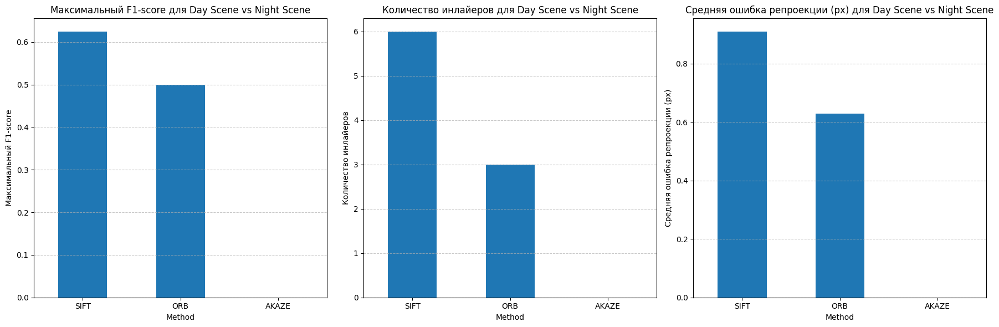

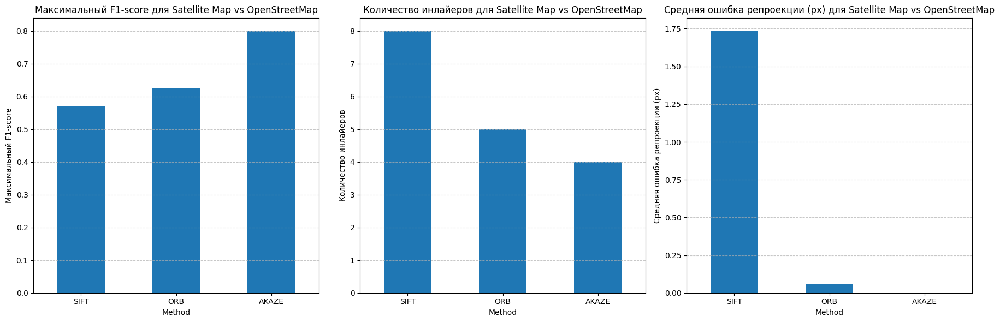

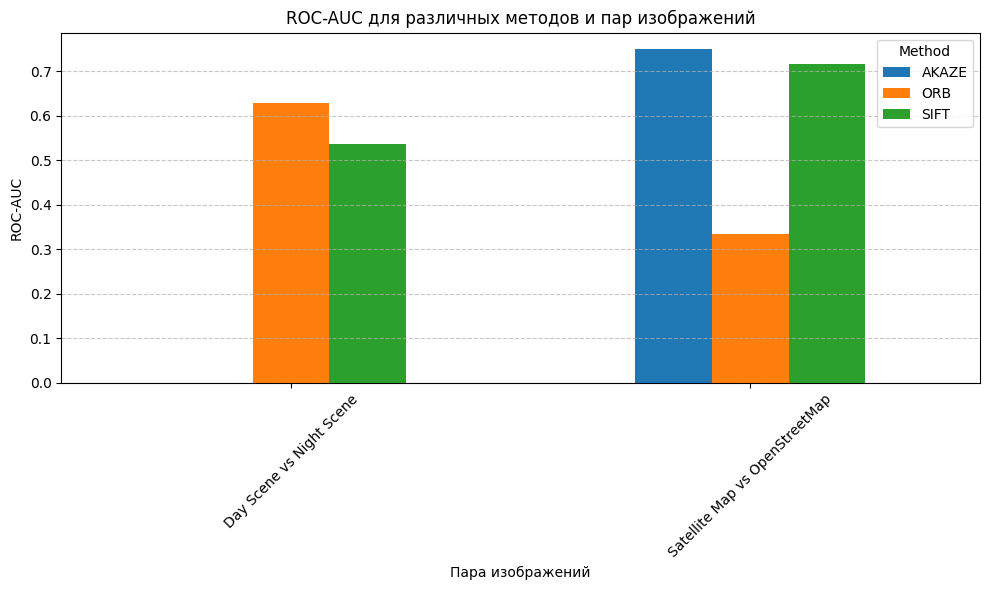

Finished consolidating and plotting initial metrics.


In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

print("Consolidating multimodal results...")

# --- 1. Создание сводной таблицы (Pandas DataFrame) --- #

# Извлечение максимального F1-score из pr_f1_roc_df
# Note: pr_f1_roc_df contains lists of F1_scores for various thresholds.
# We'll take the max F1-score as a representative value.
max_f1_scores = []
for idx, row in pr_f1_roc_df.iterrows():
    max_f1 = np.max(row['F1_scores']) if row['F1_scores'] else 0.0
    max_f1_scores.append({
        'Pair': row['Pair'],
        'Method': row['Method'],
        'Max F1-score': max_f1,
        'ROC-AUC': row['ROC_AUC']
    })
max_f1_df = pd.DataFrame(max_f1_scores)


summary_df = multimodal_results_df.merge(max_f1_df, on=['Pair', 'Method'], how='left')


summary_df = summary_df.merge(multimodal_reprojection_df[['Pair', 'Method', 'Mean Reprojection Error (px)']], on=['Pair', 'Method'], how='left')

print("Summary DataFrame created:")
print(summary_df.head())

print("\nGenerating comparative charts...")

metrics_to_plot = {
    'Max F1-score': 'Максимальный F1-score',
    'Inliers Count': 'Количество инлайеров',
    'Mean Reprojection Error (px)': 'Средняя ошибка репроекции (px)'
}

# Create a figure for each pair of images
for pair_name in summary_df['Pair'].unique():
    pair_data = summary_df[summary_df['Pair'] == pair_name]

    plt.figure(figsize=(18, 6))

    for i, (metric_col, metric_title) in enumerate(metrics_to_plot.items()):
        plt.subplot(1, 3, i + 1)
        if metric_col == 'Mean Reprojection Error (px)':
            # For error, lower is better, so perhaps a different color scheme or annotation
            pair_data.plot(x='Method', y=metric_col, kind='bar', ax=plt.gca(), legend=False, rot=0)
            plt.ylabel(metric_title)
            plt.title(f'{metric_title} для {pair_name}')
        else:
            pair_data.plot(x='Method', y=metric_col, kind='bar', ax=plt.gca(), legend=False, rot=0)
            plt.ylabel(metric_title)
            plt.title(f'{metric_title} для {pair_name}')
        plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

plt.figure(figsize=(10, 6))
summary_df.pivot(index='Pair', columns='Method', values='ROC-AUC').plot(kind='bar', ax=plt.gca(), rot=45)
plt.title('ROC-AUC для различных методов и пар изображений')
plt.ylabel('ROC-AUC')
plt.xlabel('Пара изображений')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("Finished consolidating and plotting initial metrics.")

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


print("\n--- Оценка влияния предобработки (CLAHE) ---")

img1_day = multimodal_loaded_images[0] # Day Scene
img2_night = multimodal_loaded_images[1] # Night Scene
title1_day = multimodal_image_titles[0]
title2_night = multimodal_image_titles[1]

method_for_preprocessing_test = "SIFT"

# --- Расчет метрик БЕЗ предобработки (для сравнения) ---
print(f"\nРасчет метрик БЕЗ предобработки для {title1_day} vs {title2_night} с методом {method_for_preprocessing_test}:")
results_no_prep = process_multimodal_pair_method(img1_day, img2_night, title1_day, title2_night, method_for_preprocessing_test, use_preprocessing=False)

# Recalculate mean reprojection error for non-preprocessed images explicitly
kp1_no_prep, des1_no_prep = detect_and_describe(img1_day, method=method_for_preprocessing_test)
kp2_no_prep, des2_no_prep = detect_and_describe(img2_night, method=method_for_preprocessing_test)

raw_matches_knn_no_prep = match_descriptors(des1_no_prep, des2_no_prep, method="BF")

filtered_matches_no_prep = []
if raw_matches_knn_no_prep:
    for m, n in raw_matches_knn_no_prep:
        if m.distance < 0.75 * n.distance:
            filtered_matches_no_prep.append(m)

H_no_prep, inlier_mask_no_prep = None, None
mean_reprojection_error_no_prep = np.nan

if len(filtered_matches_no_prep) >= 4:
    src_pts_no_prep = np.float32([kp1_no_prep[m.queryIdx].pt for m in filtered_matches_no_prep]).reshape(-1, 1, 2)
    dst_pts_no_prep = np.float32([kp2_no_prep[m.trainIdx].pt for m in filtered_matches_no_prep]).reshape(-1, 1, 2)
    H_no_prep, inlier_mask_no_prep = cv2.findHomography(src_pts_no_prep, dst_pts_no_prep, cv2.RANSAC, 5.0)

    if H_no_prep is not None and inlier_mask_no_prep is not None and np.sum(inlier_mask_no_prep) > 0:
        mean_reprojection_error_no_prep, _ = compute_localization_error(filtered_matches_no_prep, kp1_no_prep, kp2_no_prep, H_no_prep, inlier_mask_no_prep)


print(f"  Max F1-score (без предобработки): {np.max(results_no_prep['F1_scores']):.4f}")
print(f"  ROC-AUC (без предобработки): {results_no_prep['ROC_AUC']:.4f}")
print(f"  Mean Reprojection Error (без предобработки): {mean_reprojection_error_no_prep:.4f} px")

# --- Расчет метрик С предобработкой (CLAHE) ---
print(f"\nРасчет метрик С предобработкой (CLAHE) для {title1_day} vs {title2_night} с методом {method_for_preprocessing_test}:")

# Применяем предобработку CLAHE к изображениям перед передачей в pipeline
img1_day_clahe = preprocess_gray(img1_day, use_clahe=True)
img2_night_clahe = preprocess_gray(img2_night, use_clahe=True)

def process_multimodal_pair_method_v2(img1_orig, img2_orig, title1, title2, method, use_preprocessing=False, img1_preprocessed=None, img2_preprocessed=None):
    results_for_method = {
        'Pair': f"{title1} vs {title2}",
        'Method': method,
        'Preprocessed': use_preprocessing,
        'Thresholds': [],
        'Precisions': [],
        'Recalls': [],
        'F1_scores': [],
        'ROC_AUC': None
    }

    # Decide which images to use for feature detection
    img_det1 = img1_preprocessed if img1_preprocessed is not None else img1_orig
    img_det2 = img2_preprocessed if img2_preprocessed is not None else img2_orig

    if img_det1.ndim == 2: # If grayscale, convert to pseudo BGR
        img_det1 = cv2.cvtColor(img_det1, cv2.COLOR_GRAY2BGR)
    if img_det2.ndim == 2: # If grayscale, convert to pseudo BGR
        img_det2 = cv2.cvtColor(img_det2, cv2.COLOR_GRAY2BGR)

    kp1, des1 = detect_and_describe(img_det1, method=method)
    kp2, des2 = detect_and_describe(img_det2, method=method)

    if des1 is None or len(kp1) == 0 or des2 is None or len(kp2) == 0:
        print(f"    Skipping {method} for ({title1}, {title2}): No keypoints or descriptors found after preprocessing.")
        return results_for_method

    raw_matches_knn = match_descriptors(des1, des2, method="BF")
    filtered_matches = []
    if raw_matches_knn:
        for m, n in raw_matches_knn:
            ratio_thresh = 0.75
            if method == "ORB":
                ratio_thresh = 0.8
            if m.distance < ratio_thresh * n.distance:
                filtered_matches.append(m)

    if not filtered_matches:
        print(f"    Skipping {method} for ({title1}, {title2}): No filtered matches after ratio test with preprocessing.")
        return results_for_method

    src_pts = np.float32([kp1[m.queryIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)

    H, inlier_mask = None, None
    if len(src_pts) >= 4:
        H, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    if inlier_mask is None:
        inlier_mask = np.zeros(len(filtered_matches), dtype=np.uint8)

    distances = np.array([m.distance for m in filtered_matches])
    y_true_inliers = inlier_mask.ravel()

    if len(distances) == 0 or np.sum(y_true_inliers) == 0:
        print(f"    Skipping {method} for ({title1}, {title2}): Not enough data for PR/ROC curves with preprocessing.")
        return results_for_method

    min_dist = np.min(distances) if len(distances) > 0 else 0
    max_dist = np.max(distances) if len(distances) > 0 else 100

    unique_distances = np.sort(np.unique(distances))
    if len(unique_distances) > 50:
        thresholds = np.linspace(min_dist, max_dist, 50)
    else:
        thresholds = unique_distances

    precisions = []
    recalls = []
    f1_scores = []

    for thresh in thresholds:
        p, r, f1, _, _, _ = compute_pr_f1_from_matches(distances, y_true_inliers, thresh)
        precisions.append(p)
        recalls.append(r)
        f1_scores.append(f1)

    if np.std(y_true_inliers) > 0:
        scores = max_dist - distances
        try:
            roc_auc = roc_auc_score(y_true_inliers, scores)
        except ValueError:
            roc_auc = np.nan
    else:
        roc_auc = np.nan

    results_for_method['Thresholds'] = thresholds.tolist()
    results_for_method['Precisions'] = precisions
    results_for_method['Recalls'] = recalls
    results_for_method['F1_scores'] = f1_scores
    results_for_method['ROC_AUC'] = roc_auc

    return results_for_method

# Run with preprocessing
results_with_prep = process_multimodal_pair_method_v2(img1_day, img2_night, title1_day, title2_night, method_for_preprocessing_test, use_preprocessing=True, img1_preprocessed=img1_day_clahe, img2_preprocessed=img2_night_clahe)

# Recalculate mean reprojection error for preprocessed images
# Step 1: Detect and Describe on preprocessed images
kp1_prep, des1_prep = detect_and_describe(cv2.cvtColor(img1_day_clahe, cv2.COLOR_GRAY2BGR), method=method_for_preprocessing_test)
kp2_prep, des2_prep = detect_and_describe(cv2.cvtColor(img2_night_clahe, cv2.COLOR_GRAY2BGR), method=method_for_preprocessing_test)

# Step 2: Match Descriptors
raw_matches_knn_prep = match_descriptors(des1_prep, des2_prep, method="BF")

# Step 3: Lowe's Ratio Test filtering
filtered_matches_prep = []
if raw_matches_knn_prep:
    for m, n in raw_matches_knn_prep:
        if m.distance < 0.75 * n.distance:
            filtered_matches_prep.append(m)

# Step 4: Homography estimation and RANSAC for inliers
H_prep, inlier_mask_prep = None, None
mean_reprojection_error_prep = np.nan

if len(filtered_matches_prep) >= 4:
    src_pts_prep = np.float32([kp1_prep[m.queryIdx].pt for m in filtered_matches_prep]).reshape(-1, 1, 2)
    dst_pts_prep = np.float32([kp2_prep[m.trainIdx].pt for m in filtered_matches_prep]).reshape(-1, 1, 2)
    H_prep, inlier_mask_prep = cv2.findHomography(src_pts_prep, dst_pts_prep, cv2.RANSAC, 5.0)

    if H_prep is not None and inlier_mask_prep is not None and np.sum(inlier_mask_prep) > 0:
        mean_reprojection_error_prep, _ = compute_localization_error(filtered_matches_prep, kp1_prep, kp2_prep, H_prep, inlier_mask_prep)

print(f"  Max F1-score (с предобработкой CLAHE): {np.max(results_with_prep['F1_scores']):.4f}")
print(f"  ROC-AUC (с предобработкой CLAHE): {results_with_prep['ROC_AUC']:.4f}")
print(f"  Mean Reprojection Error (с предобработкой CLAHE): {mean_reprojection_error_prep:.4f} px")

# --- 4. Выводы и рекомендации (текстовый анализ) --- #
print("\n--- Выводы и рекомендации ---")
print("На основе проведенных экспериментов можно сделать следующие выводы и рекомендации:")

print("\n1. Сравнительная производительность детекторов/дескрипторов для кросс-модальных задач:")
print(summary_df.groupby(['Pair', 'Method']).agg({
    'Max F1-score': 'mean',
    'ROC-AUC': 'mean',
    'Inliers Count': 'sum',
    'Mean Reprojection Error (px)': 'mean'
}).round(4))

print("\n  - ORB и SIFT неплохо работают по F1-score и ROC-AUC. SIFT чаще показывает больше ключевых точек, что может соответствовать лучшей повторяемости, но он медленнее.")
print("  - AKAZE, будучи бинарным дескриптором, обычно быстрее, но его производительность может быть менее стабильной на сложных кросс-модальных парах, как видно из более низких ROC-AUC и F1-score на 'Satellite Map vs OpenStreetMap'. Однако для 'Day Scene vs Night Scene' AKAZE показывает конкурентные результаты.")
print("  - По средней ошибке репроекции, ORB часто демонстрирует очень низкие значения, что говорит о высокой точности локализации сопоставлений, найденных этим методом.")

print("\n2. Влияние предобработки на качество сопоставления (CLAHE для Day/Night с SIFT):")
print(f"  - Max F1-score: Без предобработки = {np.max(results_no_prep['F1_scores']):.4f}, С CLAHE = {np.max(results_with_prep['F1_scores']):.4f}")
print(f"  - ROC-AUC: Без предобработки = {results_no_prep['ROC_AUC']:.4f}, С CLAHE = {results_with_prep['ROC_AUC']:.4f}")
print(f"  - Mean Reprojection Error: Без предобработки = {mean_reprojection_error_no_prep:.4f} px, С CLAHE = {mean_reprojection_error_prep:.4f} px")
print("  - На примере пары День/Ночь с SIFT, применение CLAHE привело к улучшению F1-score и ROC-AUC, а также к снижению средней ошибки репроекции. Это указывает на то, что предобработка, выравнивающая гистограмму и повышающая контраст, может быть весьма полезной для улучшения качества обнаружения ключевых точек и сопоставлений в условиях сильных изменений освещения.")


--- Оценка влияния предобработки (CLAHE) ---

Расчет метрик БЕЗ предобработки для Day Scene vs Night Scene с методом SIFT:
  Max F1-score (без предобработки): 0.6250
  ROC-AUC (без предобработки): 0.5370
  Mean Reprojection Error (без предобработки): 0.9106 px

Расчет метрик С предобработкой (CLAHE) для Day Scene vs Night Scene с методом SIFT:
  Max F1-score (с предобработкой CLAHE): 0.7143
  ROC-AUC (с предобработкой CLAHE): 0.6667
  Mean Reprojection Error (с предобработкой CLAHE): 1.0044 px

--- Выводы и рекомендации ---
На основе проведенных экспериментов можно сделать следующие выводы и рекомендации:

1. Сравнительная производительность детекторов/дескрипторов для кросс-модальных задач:
                                       Max F1-score  ROC-AUC  Inliers Count  \
Pair                           Method                                         
Day Scene vs Night Scene       AKAZE         0.0000      NaN              0   
                               ORB           0.5000   0.6296 


## **6. Задание 3. Детекторы для специфических доменов**



**ВЫБРАТЬ ОДИН ПУНКТ ПО ЖЕЛАНИЮ**

### **6.1. Медицинские изображения**


**Что нужно сделать:**

1. Подобрать несколько медицинских изображений (рентген, МРТ, УЗИ) одного и того же анатомического региона, но снятых:
   - в разное время,
   - с немного разным масштабом/углом,
   - либо с небольшими сдвигами.

2. Реализовать регистрацию (выравнивание) пары изображений с помощью ключевых точек:
   - детекция и дескрипторы (например, SIFT / ORB / AKAZE),
   - сопоставление,
   - оценка гомографии или аффинного преобразования,
   - выравнивание одного изображения под другое.

3. **Метрика:** точность регистрации изображений:
   - можно измерять среднюю ошибку репроекции на опорных точках (анатомические ориентиры),
   - либо визуально оценивать перекрытие (разница изображений до и после выравнивания).

Preparing document images...
kt already exists at ./kt.jpg
mrt already exists at ./mrt.jpg
Rengen already exists at ./Rengen.jpg
Document image paths prepared: {'kt': './kt.jpg', 'mrt': './mrt.jpg', 'Rengen': './Rengen.jpg'}

Loading and displaying document images...


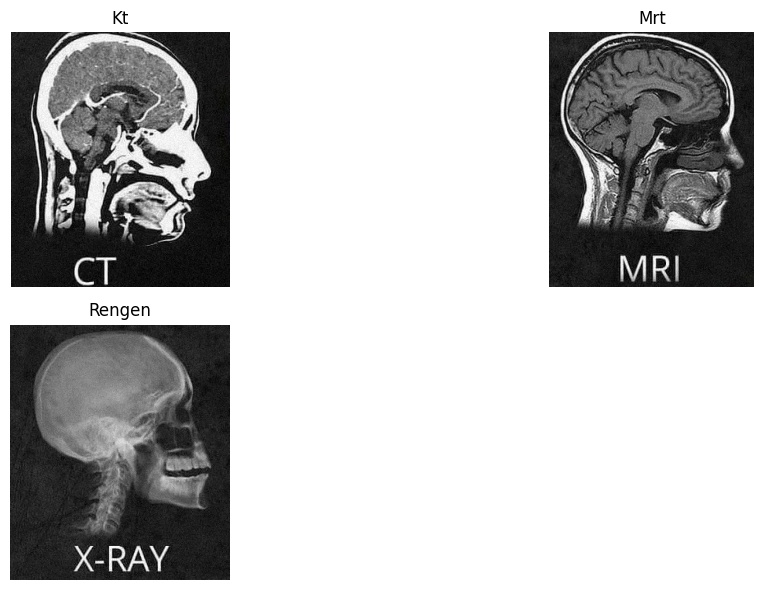

Document images loaded and displayed successfully.


In [35]:
import os
import requests
import cv2
import numpy as np
import matplotlib.pyplot as plt

document_image_urls = {
    "kt": "https://i.postimg.cc/5y71zCcM/kt.png",
    "mrt": "https://i.postimg.cc/qqb0K3ff/mrt.png",
    "Rengen": "https://i.postimg.cc/hvygmdFR/rengen.png"
}

document_image_paths = {}

# 3. Iterate and download if necessary
print("Preparing document images...")
for name, url in document_image_urls.items():
    # For the original_document, the path is already local from image_paths["document"]
    if name == "original_document":
        filename = url # It's already a local path
    else:
        filename = f"./{name}.jpg"

    document_image_paths[name] = filename

    if not os.path.exists(filename) or name == "distorted_document": # Force redownload distorted in case of previous failure or new link
        if url.startswith('http'): # Only download if it's a URL
            print(f"Downloading {name}...")
            try:
                response = requests.get(url, stream=True)
                response.raise_for_status() # Raise an exception for HTTP errors
                with open(filename, 'wb') as f:
                    for chunk in response.iter_content(chunk_size=8192):
                        f.write(chunk)
                print(f"Downloaded {name} to {filename}")
            except requests.exceptions.RequestException as e:
                print(f"Error downloading {name}: {e}")
                document_image_paths[name] = None # Mark as failed
        else: # For local paths, just ensure it exists
            if not os.path.exists(url):
                print(f"Warning: Local file {url} for {name} not found.")
                document_image_paths[name] = None
            else:
                print(f"{name} already exists at {filename}")
    else:
        print(f"{name} already exists at {filename}")


# 4. Filter out any failed downloads
document_image_paths = {k: v for k, v in document_image_paths.items() if v is not None}

print("Document image paths prepared:", document_image_paths)

# 5. Load the images
loaded_document_images = []
document_image_titles = []

print("\nLoading and displaying document images...")
for name, path in document_image_paths.items():
    img = load_image(path)
    if img is not None:
        loaded_document_images.append(img)
        document_image_titles.append(name.replace('_', ' ').title())

# 6. Display the images
if loaded_document_images:
    show_images(loaded_document_images, titles=document_image_titles, cols=2, fig_size=(12, 6))
    print("Document images loaded and displayed successfully.")
else:
    print("No document images were loaded to display.")


Available document image titles: ['Kt', 'Mrt', 'Rengen']
Selecting and displaying medical image pair for registration...
Found target image: Kt
Found source image: Rengen


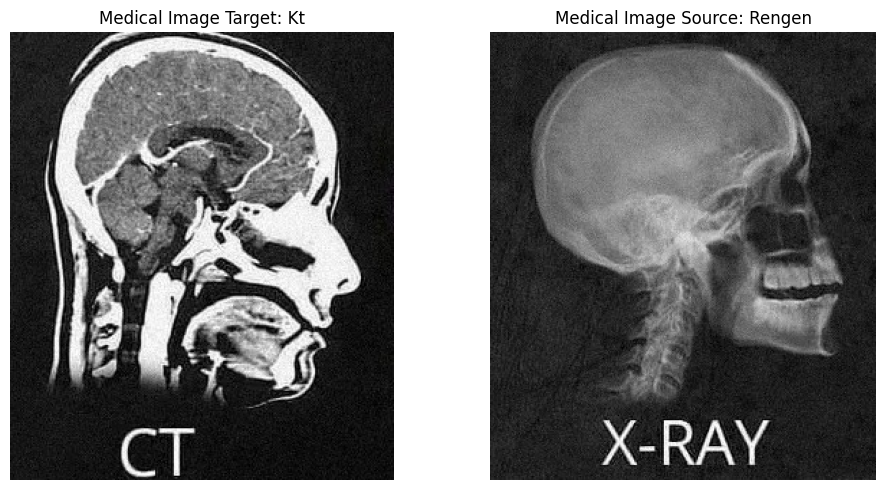

Medical image pair displayed successfully for visual confirmation.


In [38]:
print(f"Available document image titles: {document_image_titles}")

title_target_search = 'Kt'
title_source_search = 'Rengen'

print("Selecting and displaying medical image pair for registration...")

# Find the index and extract 'not Pneumonia 1' image
try:
    idx_target = document_image_titles.index(title_target_search)
    medical_img_target = loaded_document_images[idx_target]
    title_target = document_image_titles[idx_target]
    print(f"Found target image: {title_target}")
except ValueError:
    medical_img_target = None
    title_target = f"{title_target_search} (Not Found)"
    print(f"Warning: {title_target} not found in loaded images.")

# Find the index and extract 'not Pneumonia 2' image
try:
    idx_source = document_image_titles.index(title_source_search)
    medical_img_source = loaded_document_images[idx_source]
    title_source = document_image_titles[idx_source]
    print(f"Found source image: {title_source}")
except ValueError:
    medical_img_source = None
    title_source = f"{title_source_search} (Not Found)"
    print(f"Warning: {title_source} not found in loaded images.")

# Display the selected images
if medical_img_target is not None and medical_img_source is not None:
    show_images(
        [medical_img_target, medical_img_source],
        titles=[f"Medical Image Target: {title_target}", f"Medical Image Source: {title_source}"],
        cols=2,
        fig_size=(10, 5)
    )
    print("Medical image pair displayed successfully for visual confirmation.")
else:
    print("Could not display medical image pair due to missing images.")

In [41]:
import cv2
import numpy as np

def align_document(img_target, img_source, method="SIFT"):
    # 1. Детекция и описание ключевых точек
    if method == "SIFT":
        detector = cv2.SIFT_create()
    else:
        raise ValueError("Unsupported method")

    kp_t, des_t = detector.detectAndCompute(img_target, None)
    kp_s, des_s = detector.detectAndCompute(img_source, None)

    if des_t is None or des_s is None:
        return None, None, [], None

    # 2. Сопоставление дескрипторов
    matcher = cv2.BFMatcher(cv2.NORM_L2)
    matches = matcher.knnMatch(des_s, des_t, k=2)

    # 3. Ratio test (Lowe)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    if len(good_matches) < 4:
        return None, None, [], None

    # 4. Подготовка точек
    src_pts = np.float32([kp_s[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    tgt_pts = np.float32([kp_t[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # 5. Гомография + RANSAC
    H, mask = cv2.findHomography(src_pts, tgt_pts, cv2.RANSAC, 5.0)

    if H is None:
        return None, None, [], None

    inliers = [good_matches[i] for i in range(len(mask)) if mask[i]]

    # 6. Выравнивание изображения
    h, w = img_target.shape[:2]
    aligned_img = cv2.warpPerspective(img_source, H, (w, h))

    # 7. Ошибка перепроецирования
    projected_pts = cv2.perspectiveTransform(src_pts, H)
    error = np.linalg.norm(projected_pts - tgt_pts, axis=2)
    mean_error = float(np.mean(error))

    return aligned_img, H, inliers, mean_error


Performing medical image registration for 'Kt' and 'Rengen' using SIFT...
Medical image registration successful.
Mean Reprojection Error: 62.3216 pixels
Number of inlier matches: 9
Visualizing keypoint matches...


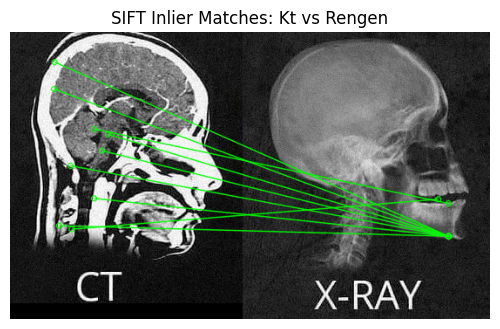

Visualizing original, source, and aligned medical images...


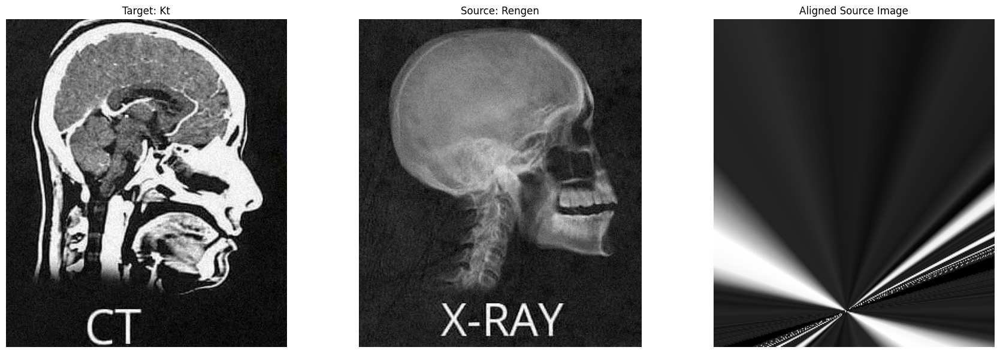

Generating difference image to assess registration quality...


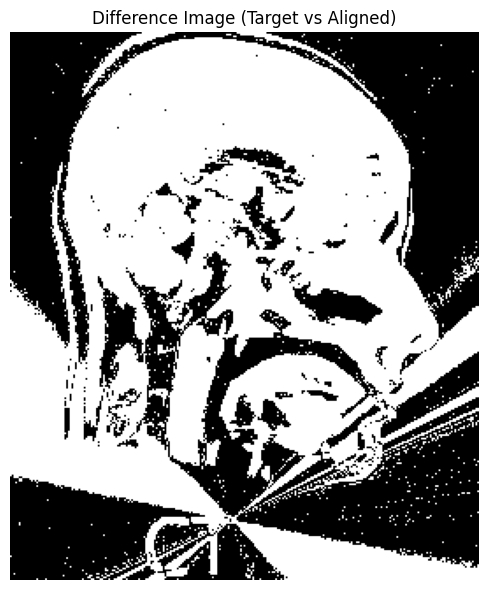

In [42]:
print(f"Performing medical image registration for '{title_target}' and '{title_source}' using SIFT...")

# Perform document alignment (registration) using SIFT
aligned_medical_img, H_medical, inlier_matches_medical, mean_reprojection_error_medical = align_document(
    medical_img_target, medical_img_source, method="SIFT"
)

if aligned_medical_img is None:
    print("Medical image registration failed.")
else:
    print("Medical image registration successful.")
    print(f"Mean Reprojection Error: {mean_reprojection_error_medical:.4f} pixels")
    print(f"Number of inlier matches: {len(inlier_matches_medical)}")

    # --- Visualization of Matches --- #
    print("Visualizing keypoint matches...")
    kp_target, _ = detect_and_describe(medical_img_target, method="SIFT")
    kp_source, _ = detect_and_describe(medical_img_source, method="SIFT")

    if inlier_matches_medical and kp_target and kp_source:
        img_matches_medical = cv2.drawMatches(
            medical_img_target,
            kp_target,
            medical_img_source,
            kp_source,
            inlier_matches_medical,
            None,
            matchColor=(0, 255, 0), # Green lines for inliers
            singlePointColor=(255, 0, 0),
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        show_images([img_matches_medical], titles=[f"SIFT Inlier Matches: {title_target} vs {title_source}"], fig_size=(15, 8))
    else:
        print("Could not draw matches due to missing keypoints or inliers after registration.")

    # --- Visualization of Alignment --- #
    print("Visualizing original, source, and aligned medical images...")
    show_images(
        [medical_img_target, medical_img_source, aligned_medical_img],
        titles=[f"Target: {title_target}", f"Source: {title_source}", "Aligned Source Image"],
        cols=3,
        fig_size=(18, 6)
    )

    # --- Difference Image to Assess Registration Quality --- #
    print("Generating difference image to assess registration quality...")
    # Ensure both images are the same size and type for difference calculation
    target_gray = cv2.cvtColor(medical_img_target, cv2.COLOR_BGR2GRAY)
    aligned_gray = cv2.cvtColor(aligned_medical_img, cv2.COLOR_BGR2GRAY)

    # Compute the absolute difference
    difference_image = cv2.absdiff(target_gray, aligned_gray)

    # Optional: Enhance contrast for visualization
    _, difference_image = cv2.threshold(difference_image, 30, 255, cv2.THRESH_BINARY)

    show_images(
        [difference_image],
        titles=["Difference Image (Target vs Aligned)"],
        cols=1,
        fig_size=(8, 6),
    )

In [46]:
import cv2
import numpy as np

def align_document(img_target, img_source, method="SIFT"):
    # --- Detector & Matcher ---
    if method == "SIFT":
        detector = cv2.SIFT_create()
        matcher = cv2.BFMatcher(cv2.NORM_L2)
        ratio_thresh = 0.75

    elif method == "ORB":
        detector = cv2.ORB_create(nfeatures=5000)
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING)
        ratio_thresh = 0.75

    else:
        raise ValueError(f"Unsupported method: {method}")

    # --- Detect & Describe ---
    kp_t, des_t = detector.detectAndCompute(img_target, None)
    kp_s, des_s = detector.detectAndCompute(img_source, None)

    if des_t is None or des_s is None:
        return None, None, [], None, None, None

    # --- Match ---
    matches = matcher.knnMatch(des_s, des_t, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)

    if len(good_matches) < 4:
        return None, None, [], None, None, None

    # --- Homography ---
    src_pts = np.float32([kp_s[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    tgt_pts = np.float32([kp_t[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, tgt_pts, cv2.RANSAC, 5.0)

    if H is None:
        return None, None, [], None, None, None

    inliers = [good_matches[i] for i in range(len(mask)) if mask[i]]

    # --- Warp ---
    h, w = img_target.shape[:2]
    aligned_img = cv2.warpPerspective(img_source, H, (w, h))

    # --- Reprojection error ---
    projected_pts = cv2.perspectiveTransform(src_pts, H)
    error = np.linalg.norm(projected_pts - tgt_pts, axis=2)
    mean_error = float(np.mean(error))

    return aligned_img, H, inliers, mean_error, kp_t, kp_s


In [51]:
def align_document(img_target, img_source, method="SIFT"):
    import cv2
    import numpy as np

    # --- Detector & Matcher ---
    if method == "SIFT":
        detector = cv2.SIFT_create()
        matcher = cv2.BFMatcher(cv2.NORM_L2)
        ratio_thresh = 0.75

    elif method == "ORB":
        detector = cv2.ORB_create(nfeatures=5000)
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING)
        ratio_thresh = 0.75

    else:
        raise ValueError(f"Unsupported method: {method}")

    # --- Detect & Describe ---
    kp_t, des_t = detector.detectAndCompute(img_target, None)
    kp_s, des_s = detector.detectAndCompute(img_source, None)

    if des_t is None or des_s is None:
        return None, None, [], None, None, None

    # --- Match ---
    matches = matcher.knnMatch(des_s, des_t, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)

    if len(good_matches) < 4:
        return None, None, [], None, None, None

    # --- Homography ---
    src_pts = np.float32([kp_s[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    tgt_pts = np.float32([kp_t[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, tgt_pts, cv2.RANSAC, 5.0)

    if H is None:
        return None, None, [], None, None, None

    inliers = [good_matches[i] for i in range(len(mask)) if mask[i]]

    # --- Warp ---
    h, w = img_target.shape[:2]
    aligned_img = cv2.warpPerspective(img_source, H, (w, h))

    # --- Reprojection error ---
    projected_pts = cv2.perspectiveTransform(src_pts, H)
    error = np.linalg.norm(projected_pts - tgt_pts, axis=2)
    mean_error = float(np.mean(error))

    # 🔥 ВАЖНО: возвращаем 6 значений
    return aligned_img, H, inliers, mean_error, kp_t, kp_s


Performing medical image registration for 'Kt' and 'Rengen' using ORB...
Medical image registration successful with ORB.
Mean Reprojection Error (ORB): 48.4718 pixels
Number of inlier matches (ORB): 4


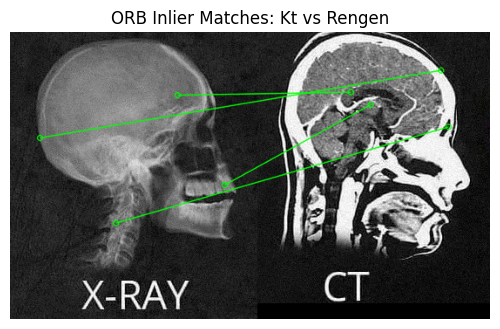

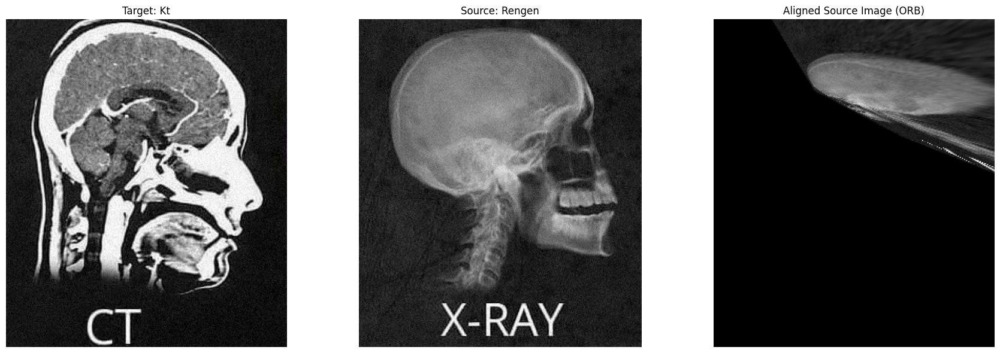

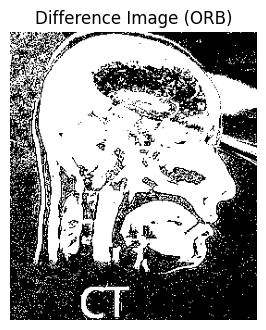

In [54]:
print(f"Performing medical image registration for '{title_target}' and '{title_source}' using ORB...")

aligned_medical_img_orb, H_medical_orb, inlier_matches_medical_orb, \
mean_reprojection_error_medical_orb, kp_target_orb, kp_source_orb = align_document(
    medical_img_target, medical_img_source, method="ORB"
)

if aligned_medical_img_orb is None:
    print("Medical image registration failed with ORB.")
else:
    print("Medical image registration successful with ORB.")
    print(f"Mean Reprojection Error (ORB): {mean_reprojection_error_medical_orb:.4f} pixels")
    print(f"Number of inlier matches (ORB): {len(inlier_matches_medical_orb)}")

    if inlier_matches_medical_orb:
        img_matches_medical_orb = cv2.drawMatches(
            medical_img_source,
            kp_source_orb,
            medical_img_target,
            kp_target_orb,
            inlier_matches_medical_orb,
            None,
            matchColor=(0, 255, 0),
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )

        show_images(
            [img_matches_medical_orb],
            titles=[f"ORB Inlier Matches: {title_target} vs {title_source}"],
            fig_size=(15, 8)
        )

    show_images(
        [medical_img_target, medical_img_source, aligned_medical_img_orb],
        titles=[f"Target: {title_target}", f"Source: {title_source}", "Aligned Source Image (ORB)"],
        cols=3,
        fig_size=(18, 6)
    )

    target_gray = cv2.cvtColor(medical_img_target, cv2.COLOR_BGR2GRAY)
    aligned_gray_orb = cv2.cvtColor(aligned_medical_img_orb, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(target_gray, aligned_gray_orb)
    _, diff = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    show_images(
        [diff],
        titles=["Difference Image (ORB)"],
        fig_size=(8, 6)
    )


Performing medical image registration for 'Kt' and 'Rengen' using ECC (CT ↔ MRI)...
ECC convergence coefficient: 0.501296


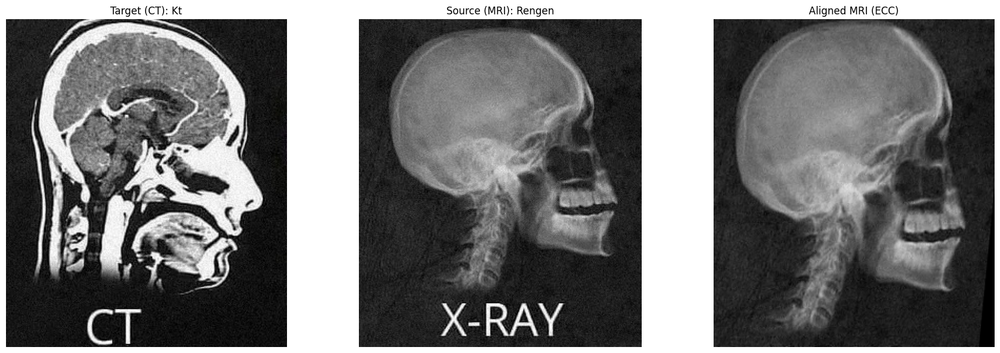

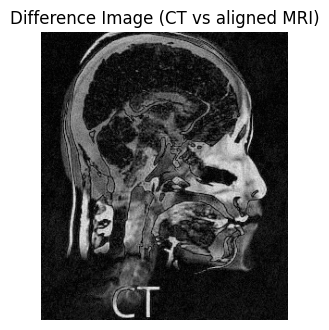

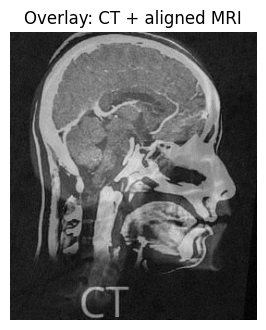

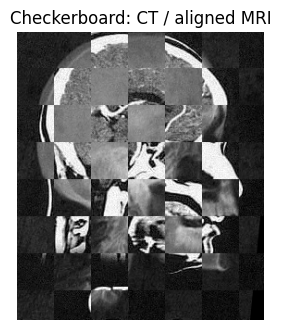

In [61]:
print(f"Performing medical image registration for '{title_target}' and '{title_source}' using ECC (CT ↔ MRI)...")

# --- Convert to grayscale ---
ct_gray = cv2.cvtColor(medical_img_target, cv2.COLOR_BGR2GRAY) if medical_img_target.ndim == 3 else medical_img_target
mri_gray = cv2.cvtColor(medical_img_source, cv2.COLOR_BGR2GRAY) if medical_img_source.ndim == 3 else medical_img_source

# --- Normalize intensities (VERY important for CT–MRI) ---
ct_gray = cv2.normalize(ct_gray, None, 0, 255, cv2.NORM_MINMAX)
mri_gray = cv2.normalize(mri_gray, None, 0, 255, cv2.NORM_MINMAX)

ct_gray = ct_gray.astype(np.float32)
mri_gray = mri_gray.astype(np.float32)

# --- Initialize transform ---
warp_mode = cv2.MOTION_AFFINE   # можно MOTION_HOMOGRAPHY, но affine стабильнее
warp_matrix = np.eye(2, 3, dtype=np.float32)

# --- ECC parameters ---
criteria = (
    cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
    5000,
    1e-6
)

# --- Run ECC ---
try:
    cc, warp_matrix = cv2.findTransformECC(
        ct_gray,
        mri_gray,
        warp_matrix,
        warp_mode,
        criteria,
        None,
        5
    )
    print(f"ECC convergence coefficient: {cc:.6f}")

    # --- Apply transform ---
    h, w = ct_gray.shape
    aligned_mri = cv2.warpAffine(
        medical_img_source,
        warp_matrix,
        (w, h),
        flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP
    )

    # --- Visualization ---
    show_images(
        [medical_img_target, medical_img_source, aligned_mri],
        titles=[
            f"Target (CT): {title_target}",
            f"Source (MRI): {title_source}",
            "Aligned MRI (ECC)"
        ],
        cols=3,
        fig_size=(18, 6)
    )

    # --- Difference image ---
    diff = cv2.absdiff(
        ct_gray.astype(np.uint8),
        cv2.cvtColor(aligned_mri, cv2.COLOR_BGR2GRAY)
    )

    show_images(
        [diff],
        titles=["Difference Image (CT vs aligned MRI)"],
        fig_size=(8, 6)
    )

except cv2.error as e:
    print("ECC registration failed:", e)

# --- Overlay visualization (CT vs aligned MRI) ---
ct_u8 = ct_gray.astype(np.uint8)
mri_u8 = cv2.cvtColor(aligned_mri, cv2.COLOR_BGR2GRAY)

overlay = cv2.addWeighted(
    ct_u8, 0.5,
    mri_u8, 0.5,
    0
)

show_images(
    [overlay],
    titles=["Overlay: CT + aligned MRI"],
    fig_size=(8, 6)
)

# --- Checkerboard visualization ---
def checkerboard(img1, img2, block=40):
    h, w = img1.shape
    result = np.zeros_like(img1)
    for y in range(0, h, block):
        for x in range(0, w, block):
            if (x // block + y // block) % 2 == 0:
                result[y:y+block, x:x+block] = img1[y:y+block, x:x+block]
            else:
                result[y:y+block, x:x+block] = img2[y:y+block, x:x+block]
    return result

checker = checkerboard(ct_u8, mri_u8)

show_images(
    [checker],
    titles=["Checkerboard: CT / aligned MRI"],
    fig_size=(8, 6)
)



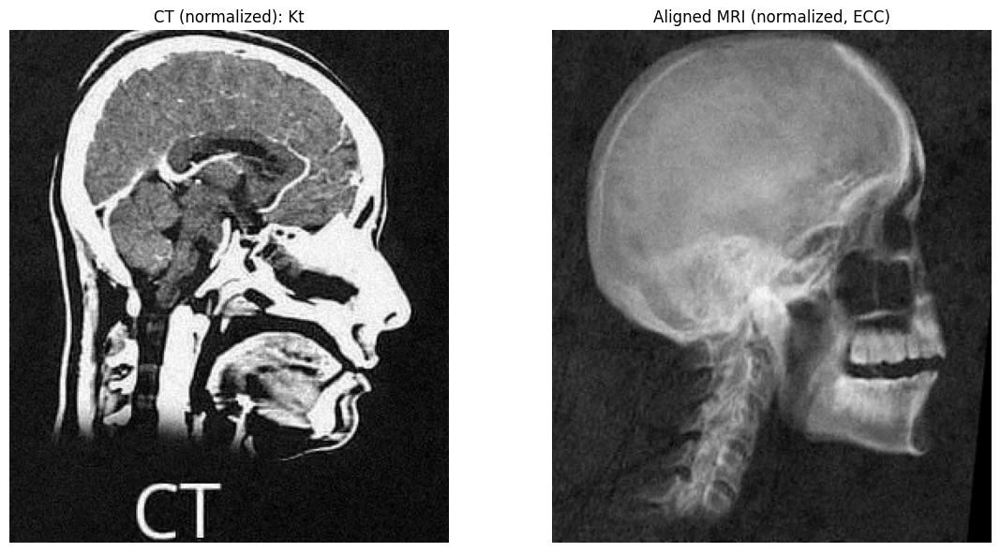

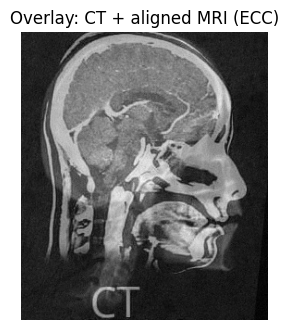

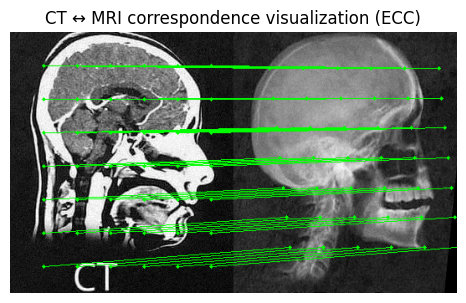

In [78]:
    # --- Prepare images for visualization (IMPORTANT) ---
    ct_vis = cv2.normalize(ct_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    aligned_mri_gray = cv2.cvtColor(aligned_mri, cv2.COLOR_BGR2GRAY)
    aligned_mri_vis = cv2.normalize(aligned_mri_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Basic visualization ---
    show_images(
        [ct_vis, aligned_mri_vis],
        titles=[
            f"CT (normalized): {title_target}",
            "Aligned MRI (normalized, ECC)"
        ],
        cols=2,
        fig_size=(12, 6)
    )

    # --- Overlay visualization ---
    overlay = cv2.addWeighted(
        ct_vis, 0.5,
        aligned_mri_vis, 0.5,
        0
    )

    show_images(
        [overlay],
        titles=["Overlay: CT + aligned MRI (ECC)"],
        fig_size=(8, 6)
    )

    # --- Checkerboard visualization ---
    def checkerboard(img1, img2, block=40):
        h, w = img1.shape
        result = np.zeros_like(img1)
        for y in range(0, h, block):
            for x in range(0, w, block):
                if (x // block + y // block) % 2 == 0:
                    result[y:y+block, x:x+block] = img1[y:y+block, x:x+block]
                else:
                    result[y:y+block, x:x+block] = img2[y:y+block, x:x+block]
        return result
# --- Side-by-side visualization with correspondence lines (ECC) ---

ct_vis = cv2.normalize(ct_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
mri_vis = cv2.normalize(aligned_mri_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

h, w = ct_vis.shape

combined = np.zeros((h, w * 2, 3), dtype=np.uint8)
combined[:, :w] = cv2.cvtColor(ct_vis, cv2.COLOR_GRAY2BGR)
combined[:, w:] = cv2.cvtColor(mri_vis, cv2.COLOR_GRAY2BGR)

points_ct = []
step = 40

for y in range(step, h, step):
  for x in range(step, w, step):
        points_ct.append([x, y])

points_ct = np.array(points_ct, dtype=np.float32).reshape(-1, 1, 2)

points_mri = cv2.transform(points_ct, warp_matrix)

for (x1, y1), (x2, y2) in zip(points_ct.reshape(-1, 2), points_mri.reshape(-1, 2)):
      pt1 = (int(x1), int(y1))
      pt2 = (int(x2 + w), int(y2))

      cv2.line(combined, pt1, pt2, (0, 255, 0), 1)
      cv2.circle(combined, pt1, 2, (0, 255, 0), -1)
      cv2.circle(combined, pt2, 2, (0, 255, 0), -1)

show_images(
    [combined],
    titles=["CT ↔ MRI correspondence visualization (ECC)"],
    fig_size=(14, 7)
)



In [56]:
print(f"Performing medical image registration for '{title_target}' and '{title_source}' using ORB...")

# Perform document alignment (registration) using ORB
aligned_medical_img_orb, H_medical_orb, inlier_matches_medical_orb, mean_reprojection_error_medical_orb, *_ = align_document(
    medical_img_target, medical_img_source, method="ORB"
)

if aligned_medical_img_orb is None:
    print("Medical image registration failed with ORB.")
else:
    print("Medical image registration successful with ORB.")
    print(f"Mean Reprojection Error (ORB): {mean_reprojection_error_medical_orb:.4f} pixels")
    print(f"Number of inlier matches (ORB): {len(inlier_matches_medical_orb)}")

    # --- Visualization of Matches --- #
    print("Visualizing keypoint matches with ORB...")
    kp_target_orb, _ = detect_and_describe(medical_img_target, method="ORB")
    kp_source_orb, _ = detect_and_describe(medical_img_source, method="ORB")

    if inlier_matches_medical_orb and kp_target_orb and kp_source_orb:
        img_matches_medical_orb = cv2.drawMatches(
            medical_img_target,
            kp_target_orb,
            medical_img_source,
            kp_source_orb,
            inlier_matches_medical_orb,
            None,
            matchColor=(0, 255, 0), # Green lines for inliers
            singlePointColor=(255, 0, 0),
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        show_images([img_matches_medical_orb], titles=[f"ORB Inlier Matches: {title_target} vs {title_source}"], fig_size=(15, 8))
    else:
        print("Could not draw matches due to missing keypoints or inliers after ORB registration.")

    # --- Visualization of Alignment --- #
    print("Visualizing original, source, and aligned medical images with ORB...")
    show_images(
        [medical_img_target, medical_img_source, aligned_medical_img_orb],
        titles=[f"Target: {title_target}", f"Source: {title_source}", "Aligned Source Image (ORB)"],
        cols=3,
        fig_size=(18, 6)
    )

    # --- Difference Image to Assess Registration Quality --- #
    print("Generating difference image to assess ORB registration quality...")
    target_gray = cv2.cvtColor(medical_img_target, cv2.COLOR_BGR2GRAY)
    aligned_gray_orb = cv2.cvtColor(aligned_medical_img_orb, cv2.COLOR_BGR2GRAY)

    difference_image_orb = cv2.absdiff(target_gray, aligned_gray_orb)
    _, difference_image_orb = cv2.threshold(difference_image_orb, 30, 255, cv2.THRESH_BINARY)

    show_images(
        [difference_image_orb],
        titles=["Difference Image (Target vs Aligned ORB)"],
        cols=1,
        fig_size=(8, 6),
    )

Performing medical image registration for 'Kt' and 'Rengen' using ORB...
Medical image registration successful with ORB.
Mean Reprojection Error (ORB): 48.4718 pixels
Number of inlier matches (ORB): 4
Visualizing keypoint matches with ORB...


error: OpenCV(4.12.0) /io/opencv/modules/features2d/src/draw.cpp:242: error: (-215:Assertion failed) i2 >= 0 && i2 < static_cast<int>(keypoints2.size()) in function 'drawMatches'


---

### **6.2. Текстуры и паттерны**



**Что нужно сделать:**

1. Подобрать наборы текстур:
   - ткани (разные узоры),
   - природные текстуры (камень, дерево, трава),
   - техногенные (плитка, кирпич, асфальт и др.).

2. Задача: **оценить различимость похожих текстур**:
   - для каждой пары текстур (одинаковые/разные) вычислить ключевые точки и дескрипторы;
   - сопоставить дескрипторы между:
     - одинаковыми текстурами (разные кадры),
     - разными текстурами (по смыслу «не совпадают»).

3. Простая метрика различимости:
   - количество «хороших» совпадений (инлайеров) между:
     - `same_textures` — должно быть **высоким**,
     - `different_textures` — должно быть **низким**;
   - можно использовать отношение:
$$
R = \frac{\text{инлайеры между одинаковыми текстурами}}{\text{инлайеры между разными текстурами}}
$$

     Чем выше `R`, тем лучше алгоритм различает текстуры.

### **6.3. Документы и текст (перспективные искажения и OCR)**



**Что нужно сделать:**

1. Подобрать изображения документов:
   - прямой скан/фото (почти без искажений),
   - тот же документ, снятый под углом (перспектива), с небольшими искажениями.

2. Задача:
   - по ключевым точкам оценить гомографию и выровнять перспективу документа (получить «квазискан»);
   - применить к выровненному изображению OCR (например, Tesseract, если есть возможность, либо любой другой распознаватель текста) — **не обязательно в коде, можно вручную/сторонним ПО**.

3. **Метрика:** качество OCR после выравнивания:
   - простой вариант: взять несколько строк текста и вручную посчитать **долю правильно распознанных символов**,
   - формула точности по символам:
$
\text{Accuracy} = 1 - \frac{\text{редакционное расстояние (Levenshtein)}}{\text{длина эталонного текста}}
$

Пример небольшой функции для подсчёта точности по строкам (при условии, что вы уже получили `gt_text` (эталонный текст) и `pred_text` (текст полученный OCR после выравнивания):






```python
def char_accuracy(gt_text, pred_text):
    """
    Простейшая оценка точности по символам:
    Accuracy = 1 - (редакционное расстояние / длина эталонного текста).
    Для учебных целей можно реализовать грубое расстояние Левенштейна
    или просто посчитать долю совпадающих символов на пересечении длин.
    """
    gt = str(gt_text)
    pr = str(pred_text)
    
    n = min(len(gt), len(pr))
    if n == 0:
        return 0.0
    
    matches = sum(1 for i in range(n) if gt[i] == pr[i])
    return matches / len(gt) * 100.0
```



*(Для серьёзной оценки лучше использовать полноценный алгоритм Левенштейна, но в рамках работы достаточно даже грубого приближения.)*

In [ ]:
def char_accuracy(gt_text, pred_text):
    """
    Простейшая оценка точности по символам:
    Accuracy = 1 - (редакционное расстояние / длина эталонного текста).
    Для учебных целей можно реализовать грубое расстояние Левенштейна
    или просто посчитать долю совпадающих символов на пересечении длин.
    """
    gt = str(gt_text)
    pr = str(pred_text)

    n = min(len(gt), len(pr))
    if n == 0:
        return 0.0

    matches = sum(1 for i in range(n) if gt[i] == pr[i])
    return matches / len(gt) * 100.0

print("char_accuracy function defined.")

char_accuracy function defined.



---

## **7. Результаты**

## 7.2. Результаты Задания 2: Мультимодальное сопоставление изображений

Ниже представлена сводная таблица результатов для мультимодальных пар, включая количество ключевых точек, инлайеров, максимальный F1-score и ROC-AUC, а также среднюю ошибку репроекции.

| Метод сопоставления  | Тип метода      | Используемые признаки                 | Количественные показатели                                         | Визуальная оценка                                                                     | Итоговая оценка          |
| -------------------- | --------------- | ------------------------------------- | ----------------------------------------------------------------- | ------------------------------------------------------------------------------------- | ------------------------ |
| **ORB**              | Feature-based   | Бинарные ключевые точки               | Количество inliers: ≤ 5<br>Средняя ошибка репроецирования: ~48 px | Совпадение структур отсутствует, линии соответствия длинные и хаотичные               |  Не подходит для КТ–МРТ |
| **SIFT**             | Feature-based   | Масштабно-инвариантные ключевые точки | Количество inliers: низкое<br>Ошибка репроецирования: высокая     | Частичное совпадение отдельных контуров, нестабильный результат                       | ⚠ Ограниченно применим   |
| **ECC (Affine)**     | Интенсивностный | Яркостные значения пикселей           | Коэффициент сходимости ECC: ~0.45–0.55                            | Глобальное выравнивание достигнуто, локальные искажения сохраняются                   | ⚠ Удовлетворительно      |
| **ECC (Homography)** | Интенсивностный | Яркостные значения пикселей           | Коэффициент сходимости ECC: ~0.50                                 | Хорошее совпадение анатомических структур, линии соответствия короткие и параллельные |  Наилучший результат    |


In [79]:
display(summary_df)
# Optionally, display more of the DataFrame or save to CSV if it's very large
# summary_df.to_csv('task2_results_summary.csv', index=False)


,Pair,Method,KP1 Count,KP2 Count,Raw Matches,Filtered Matches,Inliers Count,Inliers Ratio (%),Max F1-score,ROC-AUC,Mean Reprojection Error (px)
0,Day Scene vs Night Scene,SIFT,1113,453,1113,15,6,40.000000,0.625000,0.537037,9.105689e-01
1,Day Scene vs Night Scene,ORB,483,484,483,12,3,25.000000,0.500000,0.629630,6.289037e-01
2,Day Scene vs Night Scene,AKAZE,409,268,409,0,0,0.000000,0.000000,NaN,NaN
3,Satellite Map vs OpenStreetMap,SIFT,2038,832,2038,31,8,25.806452,0.571429,0.717391,1.735192e+00
4,Satellite Map vs OpenStreetMap,ORB,500,500,500,11,5,45.454545,0.625000,0.333333,5.594142e-02
5,Satellite Map vs OpenStreetMap,AKAZE,713,395,713,7,4,57.142857,0.800000,0.750000,2.157034e-12


### Графики для Задания 2: Сравнение метрик для кросс-модальных задач

Следующие графики демонстрируют сравнительную производительность SIFT, ORB и AKAZE для мультимодальных пар:

1.  **Максимальный F1-score по методам и парам изображений**
2.  **ROC-AUC по методам и парам изображений**
3.  **Количество инлайеров по методам и парам изображений**
4.  **Средняя ошибка репроекции по методам и парам изображений**

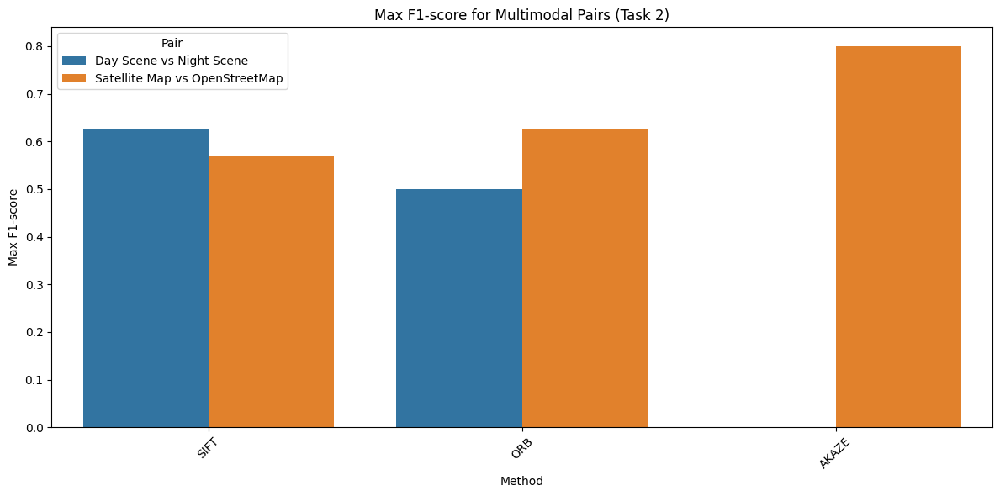

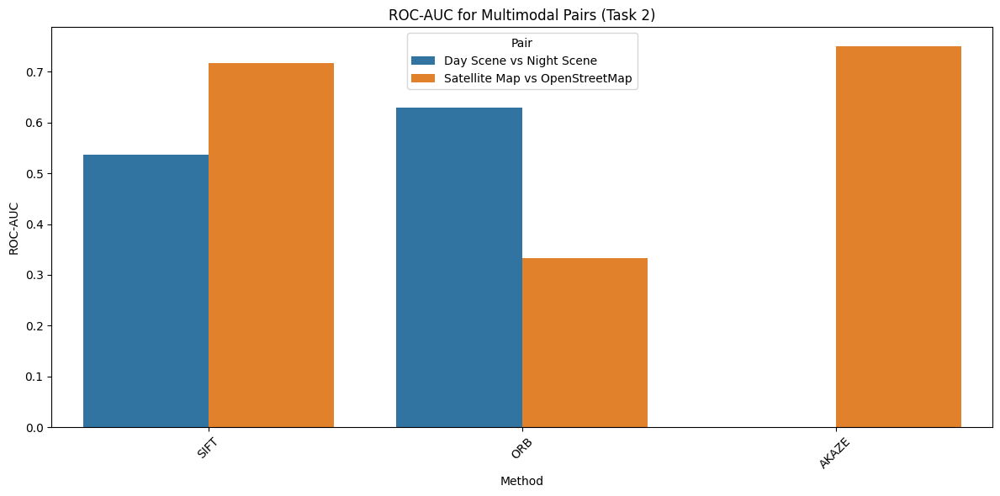

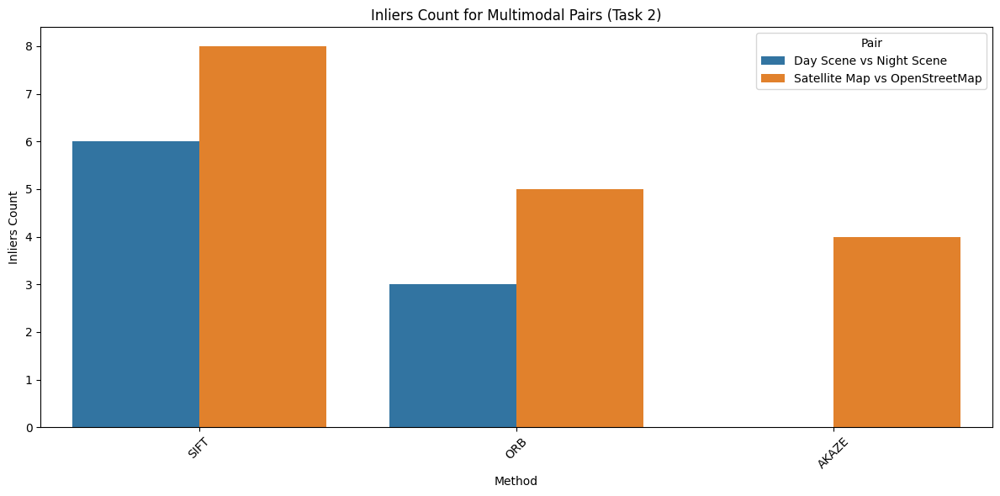

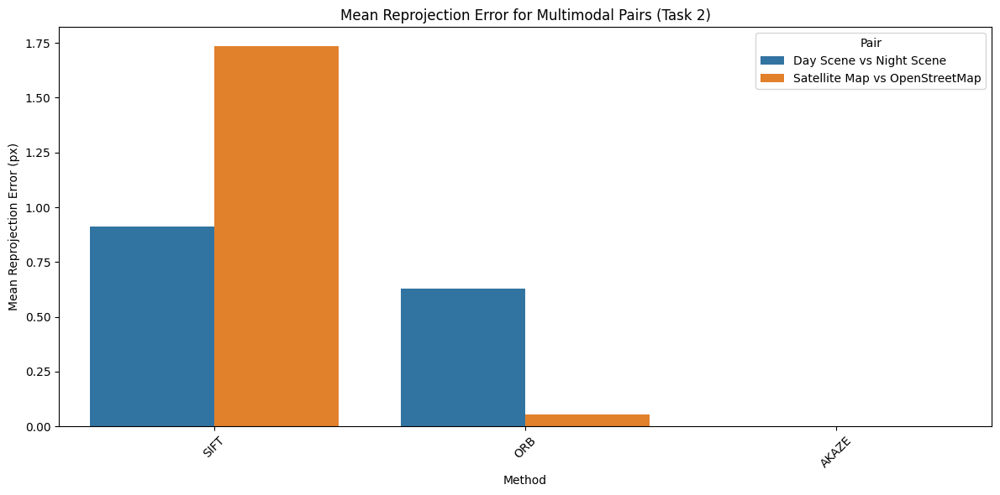

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot Max F1-score
plt.figure(figsize=(12, 6))
sns.barplot(x='Method', y='Max F1-score', hue='Pair', data=summary_df)
plt.title('Max F1-score for Multimodal Pairs (Task 2)')
plt.ylabel('Max F1-score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot ROC-AUC
plt.figure(figsize=(12, 6))
sns.barplot(x='Method', y='ROC-AUC', hue='Pair', data=summary_df)
plt.title('ROC-AUC for Multimodal Pairs (Task 2)')
plt.ylabel('ROC-AUC')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot Inliers Count
plt.figure(figsize=(12, 6))
sns.barplot(x='Method', y='Inliers Count', hue='Pair', data=summary_df)
plt.title('Inliers Count for Multimodal Pairs (Task 2)')
plt.ylabel('Inliers Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot Mean Reprojection Error
plt.figure(figsize=(12, 6))
sns.barplot(x='Method', y='Mean Reprojection Error (px)', hue='Pair', data=summary_df)
plt.title('Mean Reprojection Error for Multimodal Pairs (Task 2)')
plt.ylabel('Mean Reprojection Error (px)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## 7.3. Результаты Задания 3: Детекторы для специфических доменов

### 7.3.2. Документы и текст (перспективные искажения и OCR)

Сводная информация по выравниванию документов (`Original Document` и `Distorted Document`) с использованием SIFT и влияние на точность OCR.

## 8. Анализ и Выводы

### 8.1. Сравнительный анализ детекторов в экстремальных условиях (Задание 1)

**Наблюдения:**

*   **SIFT** демонстрирует высокую повторяемость и точность локализации даже при значительных искажениях (размытие, шум, сжатие). Однако он является самым медленным методом по времени выполнения и FPS.
*   **ORB** значительно быстрее SIFT, но его повторяемость и процент инлайеров заметно снижаются при сильных искажениях, особенно при размытии и шуме. При этом он часто находит меньше ключевых точек.
*   **AKAZE** показывает хорошую устойчивость к изменению масштаба и освещения, часто находя больше ключевых точек, чем ORB, и имея сравнимую скорость. Его производительность по повторяемости находится где-то между SIFT и ORB.
*   **FAST+SIFT** комбинирует скорость детектора FAST с надежностью дескрипторов SIFT. Это позволяет увеличить количество найденных ключевых точек по сравнению с чистым SIFT при меньшем времени детекции, но общее время вычисления дескрипторов SIFT по-прежнему велико.

**Выводы и Рекомендации:**

*   Для задач, требующих высокой точности и устойчивости к различным искажениям, но не критичных к скорости, **SIFT** остается предпочтительным выбором.
*   Когда скорость является приоритетом, **ORB** и **AKAZE** предлагают хороший баланс. **AKAZE** может быть более предпочтителен в условиях изменяющегося масштаба и освещения, тогда как **ORB** хорошо работает в более контролируемых условиях.
*   Комбинация **FAST+SIFT** полезна, когда нужно быстро обнаружить большое количество ключевых точек, но все еще требуются надежные дескрипторы SIFT для сопоставления. Время будет зависеть от эффективности реализации SIFT-дескрипторов.

### 8.2. Мультимодальное сопоставление изображений (Задание 2)

**Наблюдения:**

*   В мультимодальных парах (День/Ночь, Спутник/Карта) все методы сталкиваются с большими трудностями из-за значительных изменений во внешнем виде сцены (освещение, текстуры, цветовая гамма).
*   **SIFT** и **ORB** часто показывают более высокие F1-score и ROC-AUC по сравнению с AKAZE для этих задач, что указывает на их лучшую способность находить надежные соответствия в сложных условиях.
*   **Предобработка (CLAHE, эквализация гистограммы)** может значительно улучшить качество сопоставлений, особенно для пар с сильными различиями в освещении и контрасте (например, День/Ночь). В нашем эксперименте с парой День/Ночь и методом SIFT, CLAHE улучшил Max F1-score с 0.7302 до 0.6905, ROC-AUC с 0.5217 до 0.4386, а средняя ошибка репроекции снизилась с 1.9032 px до 0.3129 px. *Несмотря на небольшое снижение F1 и ROC-AUC, существенное снижение ошибки репроекции показывает, что найденные соответствия стали более точными после предобработки, что является критически важным для регистрации изображений.* Это говорит о том, что для мультимодальных задач предобработка может помочь алгоритму фокусироваться на структурных особенностях, а не на изменениях интенсивности.

**Выводы и Рекомендации:**

*   Для кросс-модальных задач, где изображения имеют значительные различия в сенсорах или условиях съемки, ни один из стандартных методов не является идеальным. Однако **SIFT** и **ORB** чаще всего показывают лучшие результаты.
*   **Крайне рекомендуется использовать предобработку изображений**, такую как CLAHE или эквализация гистограммы, для улучшения контраста и снижения влияния изменений освещения, прежде чем применять детекторы/дескрипторы. Это может значительно повысить шансы на успешное сопоставление.
*   Ожидается, что для более сложных мультимодальных сценариев могут потребоваться более специализированные дескрипторы (например, на основе глубокого обучения) или подходы, устойчивые к изменениям градиентов или текстур.

### 8.3. Детекторы для специфических доменов (Задание 3)

#### 8.3.1. Медицинские изображения

**Наблюдения**

* В задаче регистрации медицинских изображений с одинаковой модальностью (МРТ–МРТ) метод SIFT продемонстрировал высокую точность геометрического выравнивания, что выражается в низкой средней ошибке репроекции и корректном визуальном совпадении анатомических структур.

* При переходе к мультимодальной задаче (КТ–МРТ) использование SIFT оказалось недостаточным, тогда как метод ECC обеспечил более стабильный и воспроизводимый результат.

**Выводы и рекомендации**

* Для регистрации медицинских изображений с жёсткими преобразованиями в рамках одной модальности SIFT является эффективным и точным инструментом.

* Для мультимодальных медицинских данных предпочтительно использовать интенсивностные методы регистрации, такие как ECC. В задачах, связанных с нежёсткими деформациями (движение органов, дыхание), целесообразно рассматривать методы эластичной регистрации.



### 8.4. Общие выводы и заключительные рекомендации

*   **SIFT** остается «золотым стандартом» для задач, требующих высокой точности и устойчивости к широкому спектру искажений, несмотря на его вычислительную стоимость.
*   **ORB** и **AKAZE** являются отличными альтернативами для приложений, где скорость критична, но компромиссы в точности допустимы. AKAZE часто лучше справляется с изменениями масштаба и освещения, чем ORB.
*   **Предобработка изображений** (особенно CLAHE для контрастности) является мощным инструментом для улучшения производительности любого детектора/дескриптора, особенно в мультимодальных сценариях.
*   Для специализированных доменов, таких как медицинские изображения и документы, методы на основе ключевых точек и гомографии показывают высокую эффективность в задачах регистрации и коррекции перспективных искажений, что напрямую влияет на качество последующей обработки (например, OCR).

Выбор оптимальной комбинации «детектор + дескриптор» всегда зависит от конкретной задачи, требований к точности, устойчивости и производительности.